In [210]:
# analytics
import pandas
import pandas_datareader
import numpy
import math
import scipy
from sklearn.neighbors import KernelDensity

# date and time
import datetime
import dateutil
import time
from timeit import default_timer as timer

# graphics
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn

# networks
import networkx
from networkx.drawing.nx_agraph import graphviz_layout

# web
import urllib2
from bs4 import BeautifulSoup

# OS
import os

# inline matplotlib
%matplotlib inline

In [211]:
# function to create a directory if it does not exist
def ensure_directory(f):
    d = os.path.dirname(f)
    if not os.path.exists(d):
        os.makedirs(d)

# DATA 620 - Final Project

Derek G. Nokes

## Abstract

Graph theory is used to model pairwise relations between objects and is widely employed in the analysis of complex systems. Many, physical, biological, and social systems – including financial markets – are aptly described by networks (i.e., mathematical structures composed of nodes connected by edges). Common applications of graph theory include methods to extract statistically-reliable information from correlation-based systems. More specifically, graph-based clustering techniques are used to reveal communities (clusters) of similar elements in a network. Hierarchical clustering procedures in which communities are overlapping and organized in a nested structure, can be used to identify the fundamental frame of interactions within a system.

If we consider a correlation-based system of $I$ elements, where all elements are connected (i.e., they form a ‘complete’ graph), the pairwise correlation coefficient between each set of elements can be interpreted as the strength of the link (i.e., edge weight) connecting the pairs of elements. Very little information can be gleaned from the topology of such a complete graph. Instead, we focus on extracting a subgraph, commonly referred to as the Minimal Spanning Tree (MST). Constructed based on the so-called 'nearest neighbor single linkage nodes algorithm', a Minimal Spanning Tree is a subset of the edges of a connected, edge-weighted undirected graph that connects all of the nodes (vertices) together without any cycles, in such a way as to minimize total edge weight. The topological properties of the Minimal Spanning Tree provide an effective means for summarizing the most essential features of a correlation-based system.

##  Introduction

In this project, we seek to first develop metrics that can quantify the evolution of the state of diversity in a particular universe of single stocks over time, then propose an associated feedback or feedforward control that can be used to enhance the performance of a simple systematic trading strategy.

The ultimate dual objectives of this project are to 1) develop robust metrics that can characterize the time-varying level of diversity in a universe of single stocks, and 2) propose a feedback or feedforward control based on these diversity metrics that can be used to enhance the performance of a simple systematic trading strategy.

In the first section of the project, we set out the motivation for our work. In the second section, we acquire the required data. In the third section, we provide an overview of the theory applied in the fourth section where we detail our application. In the final section, we provide our conclusions. 

## I. Motivation

Although the public equity markets are highly accessible for nearly all classes of global investors, these markets pose some significant challenges. In particular, there is a significant degree of co-movement across single stocks, making the construction of a well-diversified portfolio difficult. The high degree of co-movement makes an investor vulnerable to broad-based declines in equity prices.

One of the simplest and most effective strategies employed by active investors to control the risk associated with broad-based declines and enhance performance when markets are rising, involves exploiting a well-known stylized fact of equity markets, namely that stocks that are moving strongly in a particular direction tend to continue to move in the same direction (i.e., they possess ‘momentum’). Momentum investing systems focus on identifying stocks that are moving persistently in a particular direction and taking a position to benefit from that directional movement. The long-only version of such strategies buys stocks that are rising most persistently and exits long positions when markets reverse.

To reduce the volatility of such a strategy, stocks that move together are typically grouped and bet as though they represent a single ‘factor’. Indeed, the most challenging aspect of developing a so-called momentum system is not the identification of momentum stocks, but rather the selection of diverse groups of stocks that – when held together – provide portfolio return smoothing and accelerate the speed of compounding. 

When we employ a fully systematic approach to manage our investments, it is possible to determine the exact responses of our strategies to any conceivable set of market conditions. As a result, we can conduct sensitivity analysis to systematically uncover undesirable strategy behavior and enhance strategy robustness. Systematic traders generally use sensitivity analysis to identify the set conditions under which the system will operate within acceptable bounds. In this project, we refer to this set of conditions as the *operational domain* of the strategy (for a specific set of trading model parameters). The broader the spectrum of market conditions over which a trading system can perform within acceptable performance bounds (i.e. the broader the operational domain of the strategy), the more robust the system.

In general, the *operational domain* of a trading strategy can be broadened through the introduction of feedback and feedforward risk controls. Feedback risk controls operate to reduce the impact of unpredictable phenomena or events on strategy performance, while feedforward controls exploit regularities in market structure to make local predictions that aid in the enhancement of strategy performance. We use feedback controls when poor trading performance is not driven by something we can predict. We use feedforward controls when we understand the drivers of poor performance and there is enough persistence in the market conditions for us to effectively anticipate future poor performance.


## II. Data

### Data Acquisition 

To perform our analysis, we require a list of the current constituents of the S&P500 index, along with corresponding sector, sub-industry, and price data.

The first part of the data set - the instrument master for our universe under study - is to be scraped from Wikipedia (https://en.wikipedia.org/wiki/List_of_S%26P_500_companies). The second part of our data set - corresponding prices for each instrument - are collected from Yahoo finance using the 'pandas_datareader' package.


### Data Preprocessing

In order to balance the responsiveness of the indicators we develop in IV of the project with our need for a statistically reliable measurement, we must select a subset of the instrument universe for which data was collected. 


In [212]:
# set the HDF5 output file directory
inputDirectory='D:/Dropbox/github/DATA_620/Final_Project/'
#inputDirectory='C:/Users/nok30/Documents/MS/github/DATA_620/Final_Project/'
# define project output directory
outputDirectory=inputDirectory

# define the input file name for prices and true range
inputFileName='sp500_wiki_yahoo.h5'
# D:\Dropbox\github\DATA_620
# read the price data from the HDF5 data store
prices = pandas.read_hdf(inputDirectory+inputFileName,'price')
# reindex
prices=prices.set_index(pandas.to_datetime(prices.index))
# define start date
startDate='2006-01-01'
# subset prices
prices=prices.loc[startDate:]

# read instrument master from the HDF5 data store
instrumentMaster = pandas.read_hdf(inputDirectory+inputFileName,
    'instrumentMaster')
# rename columns
instrumentMaster.rename(columns={'Ticker symbol' : 'instrumentTicker',
    'Security' : 'instrumentName','GICS Sector' : 'gicsSectorName',
    'GICS Sub Industry' : 'gicsSubIndustryName'},inplace=True)

In [213]:
def fullSample(prices,plotFlag,figureSize):
    # find number of observations available for each ticker
    numberOfObservations=numpy.sum(prices.isnull()==False,axis=0)    
    # compute mode
    nFullSample=numberOfObservations.mode().loc[0]
    # find the single stocks with full samples
    fullSampleIndex=numberOfObservations==nFullSample
    # extract the prices for the single stocks with full samples
         
    if (plotFlag):
        # plot histogram
        numberOfObservations.hist(figsize=figureSize)
        plt.title('Histogram \n Number of Observations')
        plt.xlabel('Number of Observations')
        plt.ylabel('Number of Instruments')    

    return fullSampleIndex,nFullSample,numberOfObservations

The distribution of the number of observations available for each ticker reveals that most of the stocks have 2957 daily periods. In the following work, we focus only on the stocks for which a full sample of 2957 daily periods is available.

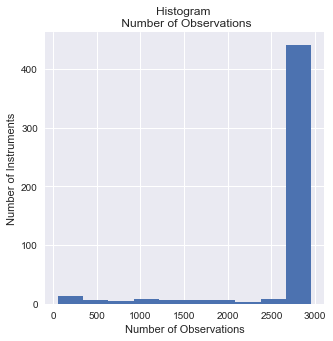

In [214]:
# set plot flag to True
plotFlag=True
# plot histogram of number of observations available for each ticker
fullSampleIndex,nFullSample,numberOfObservations=fullSample(prices,plotFlag,(5,5))
# extract the prices for the single stocks with full samples
cleanPrices=prices.loc[:,fullSampleIndex]
# find the instrument master records with full price samples
fullSampleInstrumentIndex=instrumentMaster['instrumentTicker'].isin(cleanPrices.columns.values)
# extract the instrument master records with full price samples
instrumentMaster=instrumentMaster.loc[fullSampleInstrumentIndex]

In [215]:
#nFullSample

Using the instrument master data gathered, we group stocks by sector and sub-industry.

In [216]:
instrumentMasterTable=instrumentMaster.groupby(['gicsSectorName'])['gicsSectorName'].count()
pandas.DataFrame(instrumentMasterTable.values,instrumentMasterTable.index,
    columns=['Number of Stocks']).style


,Number of Stocks
gicsSectorName,
Consumer Discretionary,66
Consumer Staples,29
Energy,27
Financials,56
Health Care,57
Industrials,56
Information Technology,59
Materials,21
Real Estate,32


In [217]:
# find number of stocks with full sample
nInstruments=len(instrumentMaster)
# display number of stocks with full sample
#nInstruments

In [218]:
#min(cleanPrices.index)

In [219]:
#max(cleanPrices.index)

In [220]:
fridayIndex=(cleanPrices.index.dayofweek==4)

In [221]:
#len(cleanPrices.loc[fridayIndex])

There are 434 instruments with prices available for the full period (i.e., between 2006-01-03 to 2017-09-29). Section III provides the theoretical justification for using a smaller subset of this universe of 434 stocks for the analysis in section IV.

## III Modeling Theory - Random Matrix Theory (RMT) and Principal Component Analysis (PCA)

In this section, we provide a brief overview the theoretical underpinnings of the modeling approaches employed in our application in section IV. First we present relavent finding from Random Matrix Theory. Next we provide an outline of the eigen-decomposition underlying the statistical factor analysis and present an approach for determining how many investment components contribute to each statistical factor. Finally, we detail the construction of both return correlation-based networks and their corresponding Minimal Spanning Trees (MSTs).


### Instrument Returns

We deﬁne a daily logarithmic return $r_{i,t}$ for instrument $i$ as

$$r_{i,t}=ln\Bigg[\frac{p_{i,t}}{p_{t-1}}\Bigg] $$
 
Where 

$p_{i,t}$ denotes the price of instrument $i$ at discrete time $t$ for $(1 \dots T)$ and $(i=1,\dots,I$).  


In [222]:
# log price by instrument
logPrices=numpy.log(cleanPrices)
# first difference to get returns
logReturns=logPrices.diff(periods=1,axis=0)

### Standardized Instrument Returns

Standardization rescales a variable while preserving its order. 

We denote the daily return of the $i^{th}$ stock for the $t^{th}$ day as $r_{t,i}$ and define the standardized return as:

$$\hat{r}_{t,i}=\frac{\left[ r_{t,i}-\bar{r}_{T,i}\right]}{\sigma_{r_{T,i}}}$$

Where

$\hat{r}_{t,i}$ is the standardized return of the $i^{th}$ stock for the $t^{th}$ day using data over the time interval one to $T$

$r_{t,i}$ is the observed return of the $i^{th}$ stock for the $t^{th}$ day

$\bar{r}_{T,i}=\frac{1}{T}\sum_{t=1}^{T}\left(\hat{r}_{t}\right)$ is the mean of the return stream of the $i^{th}$ investment over the time interval one to $T$

$\sigma_{r_{T,i}}=$ is the standard deviation of the returns for the $i^{th}$ stock over the time interval one to $T$

For each stock, we compute the daily log-return from the price (i.e., we first- difference the logarithm of the price), then 'standardize' by removing the mean and dividing by the standard deviation.


In [223]:
# standardize returns (i.e., remove the mean and divide by standard deviation)

# define standardization function
fStandardize=lambda x : (x-numpy.mean(x))/numpy.std(x)
# standardize log returns
stdLogReturns=logReturns.apply(fStandardize,axis=0)

# define standardization function where standard deviation is retained
fDetrend=lambda x : (x-numpy.mean(x))
stdLogReturnsDetrend=logReturns.apply(fDetrend,axis=0)

# define standardization function where mean is retained
fStd=lambda x : x/numpy.std(x)
# standardize log returns
stdLogReturnsWithMean=logReturns.apply(fStd,axis=0)

#### Example Plot of the Log-Price for Nvidia Corporation (Ticker 'NVDA')

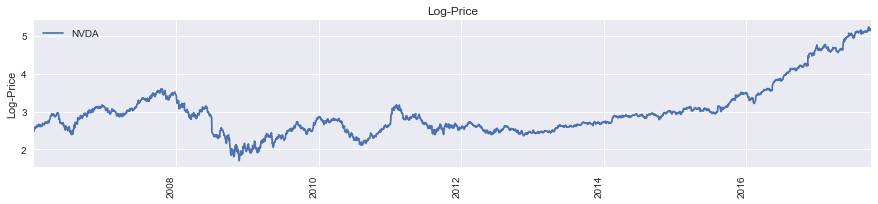

In [224]:
# define title
titleName='Log-Price'
# display the returns
logPrices['NVDA'].plot(legend=True,figsize=(15,3),rot=90,title=titleName)
# remove x-axis label
plt.xlabel("")
# add y-axis label
plt.ylabel("Log-Price")

#### Example Plot of the Log-Return for Nvidia Corporation (Ticker 'NVDA')

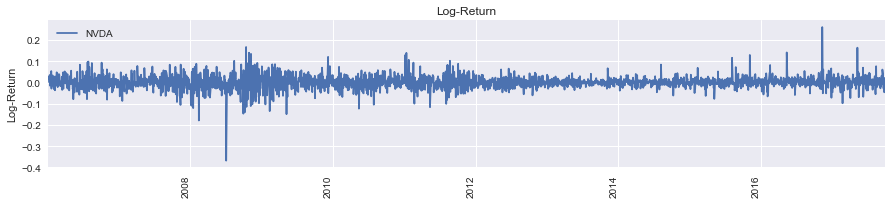

In [225]:
# define title
titleName='Log-Return'
# display the returns
logReturns['NVDA'].plot(legend=True,figsize=(15,3),rot=90,title=titleName)
# remove x-axis label
plt.xlabel("")
# add y-axis label
plt.ylabel("Log-Return")

#### Example Plot of the Standardized Return for Nvidia Corporation (Ticker 'NVDA')

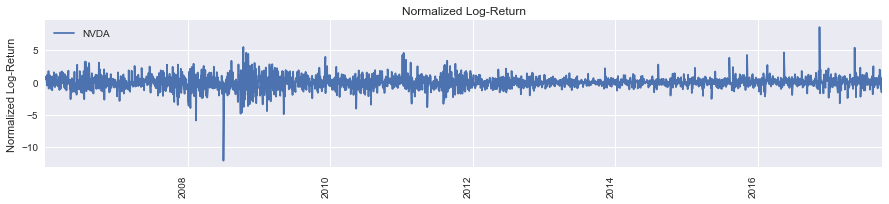

In [226]:
# define title
titleName='Normalized Log-Return'
stdLogReturns['NVDA'].plot(legend=True,figsize=(15,3),rot=90,title=titleName)
# remove x-axis label
plt.xlabel("")
# add y-axis label
plt.ylabel("Normalized Log-Return")

Notice that this standardization is based on the full sample and is thus a non-causal operation. For the exploratory analysis that follows in the sections below, this operation appropriate, but for the development of a predictive model the standardization must be based on in-sample means and standard deviations only.

After normalizing for variability, we can see that stocks in the S&P500 show a relatively high degree of co-movement.

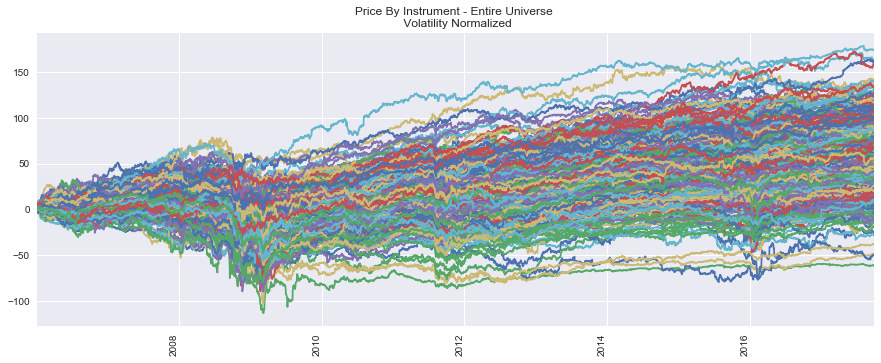

In [227]:
# define title
titleName='Price By Instrument - Entire Universe \n Volatility Normalized'
# create variability-normalized price index
standardizedLogPricesWithMean=stdLogReturnsWithMean.cumsum(axis=0)
# plot price index
standardizedLogPricesWithMean.plot(legend=False,figsize=(15,6),
    rot=90,title=titleName)
# remove x-axis label
plt.xlabel("")
# add y-axis label

In many trading and risk management applications, we seek an approach for grouping stocks that move together. In the following sections, we will explore a sub-set of the S&P500 stock universe, namely the equities with full samples belonging to the 'Consumer Staples','Energy','Information Technology','Real Estate', and 'Materials' sectors.

In [266]:
subsetSectorNameList=['Consumer Staples','Energy','Information Technology','Real Estate','Materials']
# create energy stock index
subsetIndex=instrumentMaster['gicsSectorName'].isin(subsetSectorNameList)
# extract subset instrument master
subsetInstrumentMaster=instrumentMaster.loc[subsetIndex]
# extract subset tickers
subsetTickers=subsetInstrumentMaster['instrumentTicker']
sortedSector=subsetInstrumentMaster.sort_values(by='gicsSectorName',ascending=True)
gicsSectorNameSorted=sortedSector['gicsSectorName']
instrumentTickerSorted=sortedSector['instrumentTicker']


In [229]:
# find number of stocks with full sample
nInstrumentsSubset=len(subsetInstrumentMaster)
# display number of stocks with full sample
#nInstrumentsSubset

There are 168 stocks in our subset spread across the selected sectors as follows:

In [230]:
instrumentMasterSubsetTable=subsetInstrumentMaster.groupby(['gicsSectorName'])['gicsSectorName'].count()
pandas.DataFrame(instrumentMasterSubsetTable.values,instrumentMasterSubsetTable.index,
    columns=['Number of Stocks']).style


,Number of Stocks
gicsSectorName,
Consumer Staples,29
Energy,27
Information Technology,59
Materials,21
Real Estate,32


### Statistics of Correlation Coefficients

We represent the standardized returns as an $T$ x $I$ matrix $\hat{R}$ with an empirical correlation matrix $Z$ defined as:

$$Z = \frac{1}{T}\hat{R}\hat{R}'$$

whose elements, $z_{i,j}, \in [-1,1]$

Where

$\hat{R}'$ denotes the matrix transform of $\hat{R}$

The correlation matrix ($Z$) of returns ($\hat{R}$) and the covariance matrix ($\Sigma_{\hat{R}}$) of standardized returns ($\hat{R}$) are identical.


In [231]:
# define flag to compute rolling correlations
computeRollingCorrelationsFlag=False
# define flag to compute rolling PCA
computeRollingPCA=True
# define flag to compute rolling MST (unfiltered)
computeUnfilteredMST=False
# define flag to compute rolling MST (filtered)
computeFilteredMST=False
# define the size of the rolling window in days (roughly 2 years)
lookback=500


We create a time-evolving sequence of correlation matrices by rolling the time window of $L$ returns through the full sample.

In [232]:

if (computeRollingCorrelationsFlag):
    # define datetime

    # create the directory if it does not exist
    ensure_directory(outputDirectory)  

    # start timer (compute rolling correlation)
    ts_computeRollingCorrelation = timer()    
    
    # define center flag
    centerFlag=False
    # compute centered rolling log-return correlations
    rollingCorrelation=stdLogReturns[subsetTickers].rolling(window=lookback,
        min_periods=lookback,center=centerFlag).corr(pairwise=True)
    # create the HDF5 data store for rolling correlations (not centered)
    rollingCorrelation.to_hdf(outputDirectory+'sp500_wiki_yahoo_correlation_subset.h5',
        'rollingCorrelation')

    # end timer (compute rolling correlation)
    te_computeRollingCorrelation = timer()
    
    # compute time elasped
    timeElasped_computeRollingCorrelation=te_computeRollingCorrelation-ts_computeRollingCorrelation
    
    # display time elasped
    print('Time Elasped: '+str(timeElasped_computeRollingCorrelation))
    
    
else:    
    # read rolling log-return correlations panel from the HDF5 results store
    rollingCorrelation = pandas.read_hdf(outputDirectory+'sp500_wiki_yahoo_correlation_subset.h5',
        'rollingCorrelation')


Generally, in applications the choice of $L$ is a compromise between overly noisy and overly smoothed correlation coefﬁcients [35] and is usually chosen such that $Q = \frac{T}{I} \ge 1$. 

We set the length of the time window to 500 days and compute rolling correlations between each of the 168 stocks. We advance the window one day at a time through the full sample period of 2006-01-03 to 2017-09-29, producing a correlation matrix for each day over the period 2007-12-28 to 2017-09-29.

In [233]:
# extract datetimes
dateTimes=rollingCorrelation.index.levels[0]
# extract GICs sector tickers
tickers=rollingCorrelation.index.levels[1].values
# create weekly index (each Friday)
weeklyIndex=rollingCorrelation.index.levels[0].dayofweek==4
# extract weekly datetimes
weeklyDateTimes=dateTimes[weeklyIndex]

In [239]:
#len(weeklyDateTimes)

In [235]:
def marcenkoPasturC_Q(Q):
    q = 1 / float(Q)
    lambda_min = (1 - numpy.sqrt(q))**2
    lambda_max = (1 + numpy.sqrt(q))**2

    def rho(x):
        ret = numpy.sqrt((lambda_max - x) * (x - lambda_min))
        ret /= 2 * numpy.pi * q * x
        return ret if lambda_min < x < lambda_max else 0.0

    return (lambda_min, lambda_max), rho

def marcenkoPasturC(T, N):
    q = N / float(T)
    lambda_min = (1 - numpy.sqrt(q))**2
    lambda_max = (1 + numpy.sqrt(q))**2

    def rho(x):
        ret = numpy.sqrt((lambda_max - x) * (x - lambda_min))
        ret /= 2 * numpy.pi * q * x
        return ret if lambda_min < x < lambda_max else 0.0

    return (lambda_min, lambda_max), rho

def eigenvaluePdfViaMcVsMarcenkoPastur(nDays, nInstruments,xEigenvaluesN):
    
    # find upper and lower bounds for eigenvalues and return Marcenko Pastur PDF function
    (lambdaMin, lambdaMax), rho=marcenkoPasturC(nDays, nInstruments)
    # create eigenvalue x
    xEigenvalues=numpy.linspace(lambdaMin, lambdaMax,xEigenvaluesN)
    # define Marcenko Pastur PDF lamda function 
    f = lambda x : rho(x)
    # create table to store results
    theoreticalEigenvaluePdfDf=pandas.DataFrame(xEigenvalues,columns=['xEigenvalues'])
    # compute theoretical PDF according to Marcenko Pastur
    # -evaluate theoretical PDF at each eigenvalue x
    theoreticalEigenvaluePdfDf['pdf']=theoreticalEigenvaluePdfDf['xEigenvalues'].apply(f)
    # simulate nDays x nInstruments standardized returns
    r=numpy.reshape(numpy.random.normal(0,1,nDays*nInstruments),(nDays,nInstruments))
    # covert r to dataframe
    r=pandas.DataFrame(r)
    # compute correlation matrix
    C=r.corr()
    # eigen-decomposition of correlation matrix
    eigenvalues, eigenvectors = numpy.linalg.eigh(C)
    # sort the eigenvalues and eigenvalues
    sortIndex=numpy.argsort(-eigenvalues)
    eigenvalues=eigenvalues[sortIndex]
    eigenvectors=eigenvectors[:,sortIndex]    
    
    return eigenvalues,theoreticalEigenvaluePdfDf

def plotEigenvaluePdfViaMcVsMarcenkoPastu(eigenvalues,theoreticalEigenvaluePdfDf,figureSize):
    # set figure size
    plt.figure(figsize=figureSize)
    # plot 
    plt.plot(theoreticalEigenvaluePdfDf['xEigenvalues'],theoreticalEigenvaluePdfDf['pdf'])
    # plot histogram
    plt.hist(eigenvalues,bins=75,normed=True)
    # add x-label
    plt.xlabel('Eigenvalue')
    # add y-label
    plt.ylabel('Frequency')
    # add title
    plt.title('Eigenvalue PDF')    
    
    return

def kde_sklearn(x, x_grid, bandwidth=0.2, **kwargs):
    """Kernel Density Estimation with Scikit-learn"""
    kde_skl = KernelDensity(bandwidth=bandwidth, **kwargs)
    kde_skl.fit(x[:, numpy.newaxis])
    # score_samples() returns the log-likelihood of the samples
    log_pdf = kde_skl.score_samples(x_grid[:, numpy.newaxis])
    return numpy.exp(log_pdf)

def shuffleDataFrame(df):
    return df.reindex(numpy.random.permutation(df.index))

def eigenvalueKdePdfBoundsViaMc(output_directory,nDays,nInstruments,nPaths,xEigenvaluesN,bandwidth,percentiles):

    dateTime=datetime.datetime.now()
    # set the HDF5 output file directory

    # create the directory if it does not exist
    ensure_directory(output_directory)    
    # create output file
    output_file='eigenvalueMC_'+str(nDays)+'_x_'+str(nInstruments)+'.h5'
    
    # find upper and lower bounds for eigenvalues and return Marcenko Pastur PDF function
    (lambdaMin, lambdaMax), rho=marcenkoPasturC(nDays, nInstruments)
    # create eigenvalue x
    xEigenvalues=numpy.linspace(lambdaMin, lambdaMax,xEigenvaluesN)
    # define Marcenko Pastur PDF lamda function 
    f = lambda x : rho(x)
    # create table to store results
    theoreticalEigenvaluePdfDf=pandas.DataFrame(xEigenvalues,columns=['xEigenvalues'])
    # compute theoretical PDF according to Marcenko Pastur
    # -evaluate theoretical PDF at each eigenvalue x
    theoreticalEigenvaluePdfDf['pdf']=theoreticalEigenvaluePdfDf['xEigenvalues'].apply(f)

    # create matrix to store eigenvalues
    eigenvaluesByPath=numpy.zeros([nInstruments,nPaths])
    # create matrix to store eigenvalue KDE PDF
    eigenvaluesPdfByPath=numpy.zeros([xEigenvaluesN,nPaths])
    # iterate over each path
    for pathIndex in range(0,nPaths):
        # simulate nDays x nInstruments standardized returns
        r=numpy.reshape(numpy.random.normal(0,1,nDays*nInstruments),(nDays,nInstruments))
        # covert r to dataframe
        r=pandas.DataFrame(r)
        # compute correlation matrix
        C=r.corr()
        # eigen-decomposition of correlation matrix
        eigenvalues, _ = numpy.linalg.eigh(C)
        # sort the eigenvalues and eigenvalues
        sortIndex=numpy.argsort(-eigenvalues)
        eigenvalues=eigenvalues[sortIndex]
        # do kernal smoothed density estimate
        pdf=kde_sklearn(eigenvalues, xEigenvalues, bandwidth=bandwidth)
        # store eigenvalue KDE PDF
        eigenvaluesPdfByPath[:,pathIndex]=pdf
        # store eigenvalues
        eigenvaluesByPath[:,pathIndex]=eigenvalues

    # percentile bounds
    eigenvalueBounds=numpy.percentile(eigenvaluesByPath, percentiles, axis=1).T        
    # percentile bounds
    eigenvaluePdfBounds=numpy.percentile(eigenvaluesPdfByPath, percentiles, axis=1).T
    # create eigenvalues by path dataframe
    eigenvaluesByPathDf=pandas.DataFrame(eigenvaluesByPath)
    # create eigenvalue KDE PDF dataframe
    eigenvaluesPdfByPathDf=pandas.DataFrame(eigenvaluesPdfByPath)
    # create eigenvalue bounds dataframe
    eigenvalueBoundsDf=pandas.DataFrame(eigenvalueBounds,columns=percentiles)   
    # create eigenvalue KDE PDF bounds dataframe
    eigenvaluePdfBoundsDf=pandas.DataFrame(eigenvaluePdfBounds,columns=percentiles)
    
    # store simulation parameters
    simulationParameters=dict()
    simulationParameters['nDays']=nDays
    simulationParameters['nInstruments']=nInstruments
    simulationParameters['nPaths']=nPaths
    simulationParameters['bandwidth']=bandwidth
    simulationParameters['xEigenvaluesN']=xEigenvaluesN
    simulationParameters['lambdaMin']=lambdaMin
    simulationParameters['lambdaMax']=lambdaMax
    #simulationParameters['percentiles']=percentiles
    # convert to dataframe
    simulationParametersDf=pandas.DataFrame.from_dict(simulationParameters,orient='index')
    # set column name
    simulationParametersDf.rename(columns={0 : 'parameterValue'},inplace=True)

    # create the HDF5 data store
    data_store = pandas.HDFStore(output_directory+output_file)
    # store theoretical eigenvalues dataframe
    data_store['theoreticalEigenvaluePdfDf'] = theoreticalEigenvaluePdfDf
    # store eigenvalue by path dataframe in the HDF5 data store
    data_store['eigenvaluesByPath'] = eigenvaluesByPathDf
    # store the eigenvalue KDE PDF by path dataframe in the HDF5 data store
    data_store['eigenvaluesPdfByPath'] = eigenvaluesPdfByPathDf
    # store eigenvalue bounds dataframe in the HDF5 data store
    data_store['eigenvalueBounds'] = eigenvalueBoundsDf
    # store eigenvalue KDE PDF bounds dataframe in the HDF5 data store
    data_store['eigenvaluePdfBounds'] = eigenvaluePdfBoundsDf
    # store simulation parameters dataframe
    data_store['simulationParameters'] = simulationParametersDf
    # close the HDF5 data store
    data_store.close()    
    
    return output_file,theoreticalEigenvaluePdfDf,eigenvaluesByPathDf,eigenvaluesPdfByPathDf,eigenvalueBoundsDf,eigenvaluePdfBoundsDf,simulationParametersDf

def plotActualVsTheoreticalEigenvaluePDF(nDays, nInstruments,eigenvalues,kdeFlag,figureSize):
    # find theoretical upper and lower bounds for eigenvalues + return Marcenko Pastur PDF function
    (lambdaMinTheoretical, lambdaMaxTheoretical), rho=marcenkoPasturC(nDays, nInstruments)
    # actual find upper and lower bounds
    lambdaMinActual=min(eigenvalues)
    lambdaMaxActual=max(eigenvalues)
    # create eigenvalue x (theoretical)
    xEigenvaluesActual=numpy.linspace(lambdaMinActual,lambdaMaxActual,xEigenvaluesN)
    # create eigenvalue x (theoretical)
    xEigenvaluesTheoretical=numpy.linspace(lambdaMinTheoretical, lambdaMaxTheoretical,
        xEigenvaluesN)
    # define Marcenko Pastur PDF lamda function 
    f = lambda x : rho(x)
    # KDE PDF
    pdf=kde_sklearn(eigenvalues, xEigenvaluesActual, bandwidth=0.1)
    # create table to store results
    theoreticalEigenvaluePdfDf=pandas.DataFrame(xEigenvaluesTheoretical,columns=['xEigenvalues'])
    # compute theoretical PDF according to Marcenko Pastur
    # -evaluate theoretical PDF at each eigenvalue x
    theoreticalEigenvaluePdfDf['pdf']=theoreticalEigenvaluePdfDf['xEigenvalues'].apply(f)    
    
    # create plot
    plt.figure(figsize=figureSize)
    # plot theoretical PDF
    plt.plot(theoreticalEigenvaluePdfDf['xEigenvalues'],theoreticalEigenvaluePdfDf['pdf'])
    # if kdeFlag is set to True
    if (kdeFlag):
        # plot KDE
        plt.plot(xEigenvaluesActual,pdf)
    else:
        # plot histogram
        plt.hist(eigenvalues,bins=75,normed=True)
    
    return lambdaMinActual,lambdaMaxActual,lambdaMinTheoretical, lambdaMaxTheoretical

### Eigenvalue Distribution of the Correlation Matrix

Suppose we have $I$ instrument return series with $T$ elements each. The elements of the $I \times I$ empirical correlation matrix $Z$ are given by

$$Z_{i,j}=\frac{1}{T}\sum_{t=1}^{T}\hat{r}_{t,i}\hat{r}_{t,j}$$

where $\hat{r}_{t,i}$ denotes the $t^{th}$ return of instrument $i$, normalized by its standard deviation so that $\sigma_{\hat{r}_{T,i}}^{2}=1$.

In matrix form, this may be written as

$$Z=\frac{1}{T}\hat{R}\hat{R}'$$

where $\hat{R}$ is the $T \times I$ matrix whose columns are the time series of returns, one for each instrument and $\hat{R}'$ denotes the transpose of $\hat{R}$.

If the entries of $\hat{R}$ are random with variance $\sigma^{2}$, then - in the limit where $T \to \infty$ and $I \to \infty$, such that $Q \equiv T /I$  is fixed - the density of eigenvalues of $Z$ is given by

$$\rho(\lambda) = \frac{Q}{2\pi \sigma^2 } \frac{\sqrt{(\lambda_{+} - \lambda)(\lambda_{-}-\lambda)}}{\lambda}$$

where the maximum and minimum eigenvalues ( $\lambda_{+}$ and $\lambda_{-}$ respectively) are given by

$$\lambda_{\pm} = \sigma^2\Bigg(1 \pm \sqrt{\frac{1}{Q}}\Bigg)^2$$

$\rho(\lambda)$ is commonly referred to as the Marcenko-Pastur density.

If $I$ is small relative to $T$, the empircal correlation matrix $Z$ approaches the true correlation matrix $C$.

We can see that as the number of observations $T$ increases relative to the number of instruments $I$, $Q$ increases and the shape of the eigenvalue density changes.

In [236]:
def marcenkoPasturDensityByQ(Q,xEigenvaluesN):
    
    mpDensityByQ=dict()

    for q in Q:
    
        # find theoretical upper and lower bounds for eigenvalues + return Marcenko Pastur PDF function
        (lambdaMinTheoretical, lambdaMaxTheoretical), rho=marcenkoPasturC_Q(q)
        # create eigenvalue x (theoretical)
        xEigenvaluesTheoretical=numpy.linspace(lambdaMinTheoretical, lambdaMaxTheoretical,
            xEigenvaluesN)
        # define Marcenko Pastur PDF lamda function 
        f = lambda x : rho(x)
        # create table to store results
        theoreticalEigenvaluePdfDf=pandas.DataFrame(xEigenvaluesTheoretical,columns=['xEigenvalues'])
        # compute theoretical PDF according to Marcenko Pastur
        # -evaluate theoretical PDF at each eigenvalue x
        theoreticalEigenvaluePdfDf['pdf']=theoreticalEigenvaluePdfDf['xEigenvalues'].apply(f)    
        # store theoretical eigenvalue pdf
        mpDensityByQ[str(q)]=theoreticalEigenvaluePdfDf
            
    return mpDensityByQ

def plotMarcenkoPasturDensityByQ(Q,xEigenvaluesN):
    
    # find theoretical upper and lower bounds for eigenvalues + return Marcenko Pastur PDF function
    (lambdaMinTheoretical, lambdaMaxTheoretical), rho=marcenkoPasturC_Q(Q)
    # create eigenvalue x (theoretical)
    xEigenvaluesTheoretical=numpy.linspace(lambdaMinTheoretical, lambdaMaxTheoretical,
        xEigenvaluesN)
    # define Marcenko Pastur PDF lamda function 
    f = lambda x : rho(x)
    # create table to store results
    theoreticalEigenvaluePdfDf=pandas.DataFrame(xEigenvaluesTheoretical,columns=['xEigenvalues'])
    # compute theoretical PDF according to Marcenko Pastur
    # -evaluate theoretical PDF at each eigenvalue x
    theoreticalEigenvaluePdfDf['pdf']=theoreticalEigenvaluePdfDf['xEigenvalues'].apply(f)    
    
    # create plot
    plt.figure(figsize=figureSize)
    # plot theoretical PDF
    plt.plot(theoreticalEigenvaluePdfDf['xEigenvalues'],theoreticalEigenvaluePdfDf['pdf'])    
    
    return

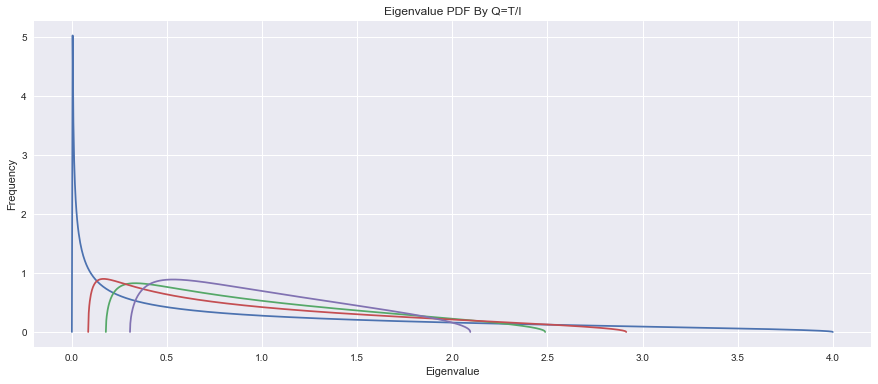

In [237]:
figureSize=(15,6)
xEigenvaluesN=1000
Q=[1,2,3,5]
mpDensityByQ=marcenkoPasturDensityByQ(Q,xEigenvaluesN)
plt.figure(figsize=figureSize)
for q in mpDensityByQ:
    plt.plot(mpDensityByQ[q]['xEigenvalues'].values,mpDensityByQ[q]['pdf'].values)
    #plt.legend()
plt.xlabel('Eigenvalue')
# add y-label
plt.ylabel('Frequency')
# add title
plt.title('Eigenvalue PDF By Q=T/I')


As $Q$ increases, the expected range of eigenvalues decreases. When $Q=1$ it is difficult to distinguish small eigenvalues from noise.

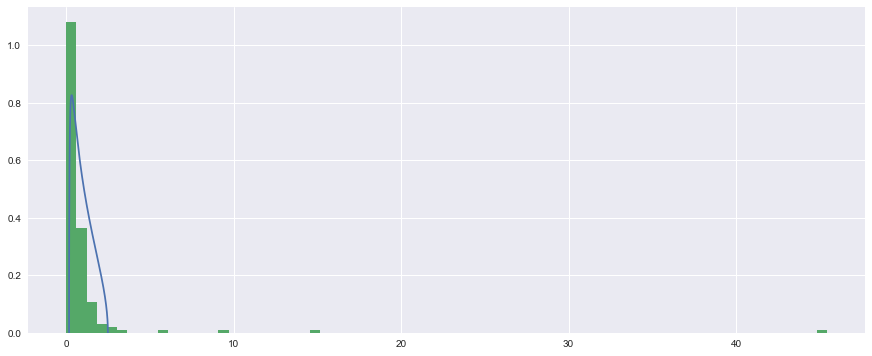

In [263]:
# define datetime
dateTime=datetime.datetime(2017,9,29)
# define KDE flag
kdeFlag=False
# set figure size
figureSize=(15,6)
# extract rolling correlation matrix for datetime
Z=rollingCorrelation.loc[dateTime,tickers]
# eigen-decomposition of full sample correlation matrix
eigenvaluesZ, eigenvectorsZ = numpy.linalg.eigh(Z)
# plot actual vs theoretical eigenvalue PDF
lambdaMinActualZ,lambdaMaxActualZ,lambdaMinTheoreticalZ, lambdaMaxTheoreticalZ=plotActualVsTheoreticalEigenvaluePDF(
    lookback, nInstrumentsSubset,eigenvaluesZ,kdeFlag,figureSize)

Given a 168 x 168 correlation matrix estimated from a 500 x 168 return matrix as-of 2017-09-29, Random Matrix Theory (RMT) predicts eigenvalues in the range of 0.18 to 2.50 while the range of eigenvalues observed for out full sample is 0.009 to 45.44.

We can see in the figure directly above that the observed distribution of eigenvalues is relatively close to the theoretical distribution. We do observe more very large and very small eigenvalues, indicating that there is significant non-random structure in the underlying data. Some interpretation of these large and small eigenvalues is provided in section IV.


In [258]:
#lambdaMinActualZ

In [259]:
#lambdaMaxActualZ

In [260]:
#lambdaMinTheoreticalZ

In [261]:
#lambdaMaxTheoreticalZ

### Noise Filtering of the Correlation Matrix - An Application of Random Matrix Theory (RMT)

We can use the findings of Random Matrix Theory to filter out measurement noise from return correlation matrices.

[Add equations / procedure for filtering correlations]

[Add reference to nearest PD correlation matrix]



In [148]:
def correlationFiltered(E,T,N):
    #    
    eigvals, eigvecs = numpy.linalg.eigh(E)
    #
    eigvecs = eigvecs.T
    #
    (lambda_min, lambda_max), _ = marcenkoPasturC(T, N)
    #
    xi_clipped = numpy.where(eigvals >= lambda_max, eigvals, numpy.nan)

    gamma = float(E.trace() - numpy.nansum(xi_clipped))
    gamma /= numpy.isnan(xi_clipped).sum()
    xi_clipped = numpy.where(numpy.isnan(xi_clipped), gamma, xi_clipped)

    E_clipped = numpy.zeros((N, N), dtype=float)

    for xi, eigvec in zip(xi_clipped, eigvecs):
        eigvec = eigvec.reshape(-1, 1)
        E_clipped += xi * eigvec.dot(eigvec.T)

    tmp = 1./numpy.sqrt(numpy.diag(E_clipped))
    E_clipped *= tmp
    E_clipped *= tmp.reshape(-1, 1)
    
    return E_clipped

# find nearest positive-definite matrix to input
def nearestPD(A):
    """Find nearest positive-definite matrix to input

    N.J. Higham, "Computing a nearest symmetric positive semidefinite
    matrix" (1988): https://doi.org/10.1016/0024-3795(88)90223-6
    """

    B = (A + A.T) / 2
    _, s, V = numpy.linalg.svd(B)
    H = numpy.dot(V.T, numpy.dot(numpy.diag(s), V))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2

    if isPD(A3):
        return A3

    spacing = numpy.spacing(numpy.linalg.norm(A))
    I = numpy.eye(A.shape[0])

    k = 1
    while not isPD(A3):
        mineig = numpy.min(numpy.real(numpy.linalg.eigvals(A3)))
        A3 += I * (-mineig * k**2 + spacing)
        k += 1

    return A3

def isPD(B):
    """Returns true when input is positive-definite, via Cholesky"""
    try:
        _ = numpy.linalg.cholesky(B)
        return True
    except numpy.linalg.LinAlgError:
        return False


We filter the correlation matrix from 2017-09-29 estimated using the previous 500 days of data using the methodology outlined above and plot the original and filtered correlation matrices.

In [264]:
# determine upper and lower theoretical bounds given lookback period and number
# of instruments
(lambda_min, lambda_max), rho=marcenkoPasturC(lookback,nInstrumentsSubset)
# filter correlation matrix
Z_clipped=correlationFiltered(Z.values,lookback,nInstrumentsSubset)

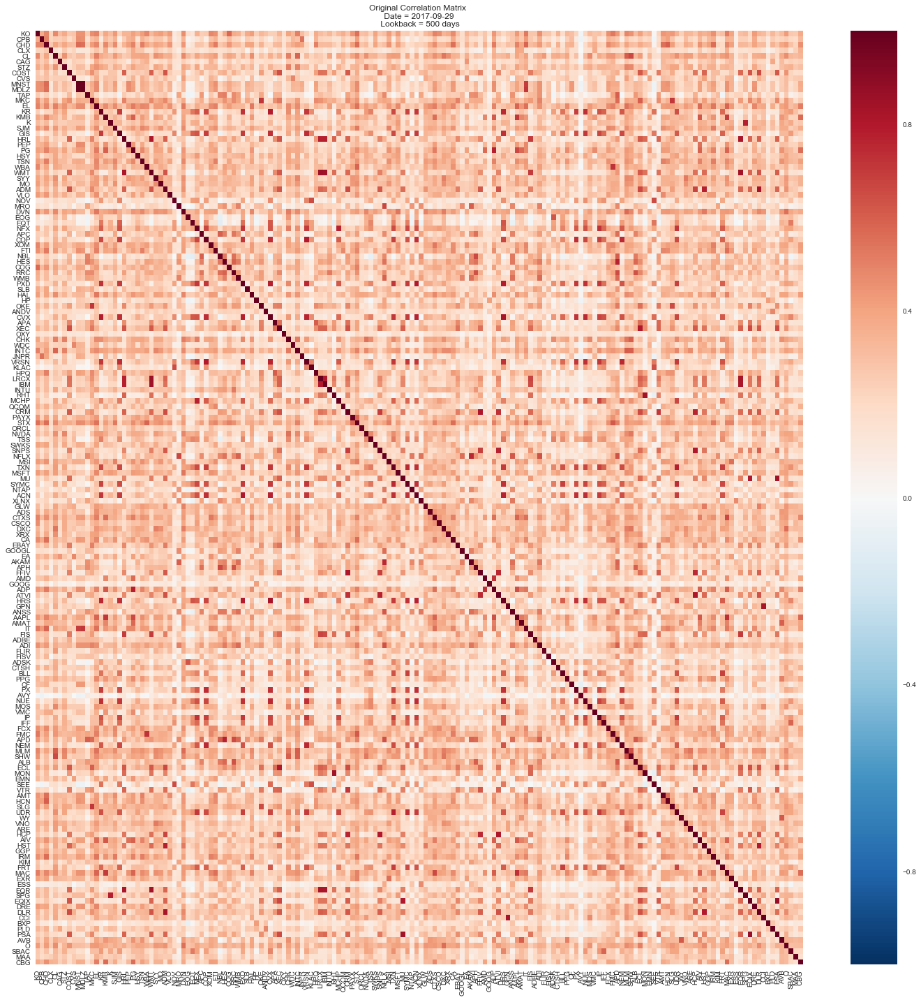

In [276]:
figureSize=(20,20)
plt.figure(figsize=figureSize)
plt.title('Original Correlation Matrix \n Date = 2017-09-29 \n Lookback = 500 days')
ax = seaborn.heatmap(Z, 
    annot=False, yticklabels=instrumentTickerSorted.values,xticklabels=instrumentTickerSorted.values)
plt.tight_layout()

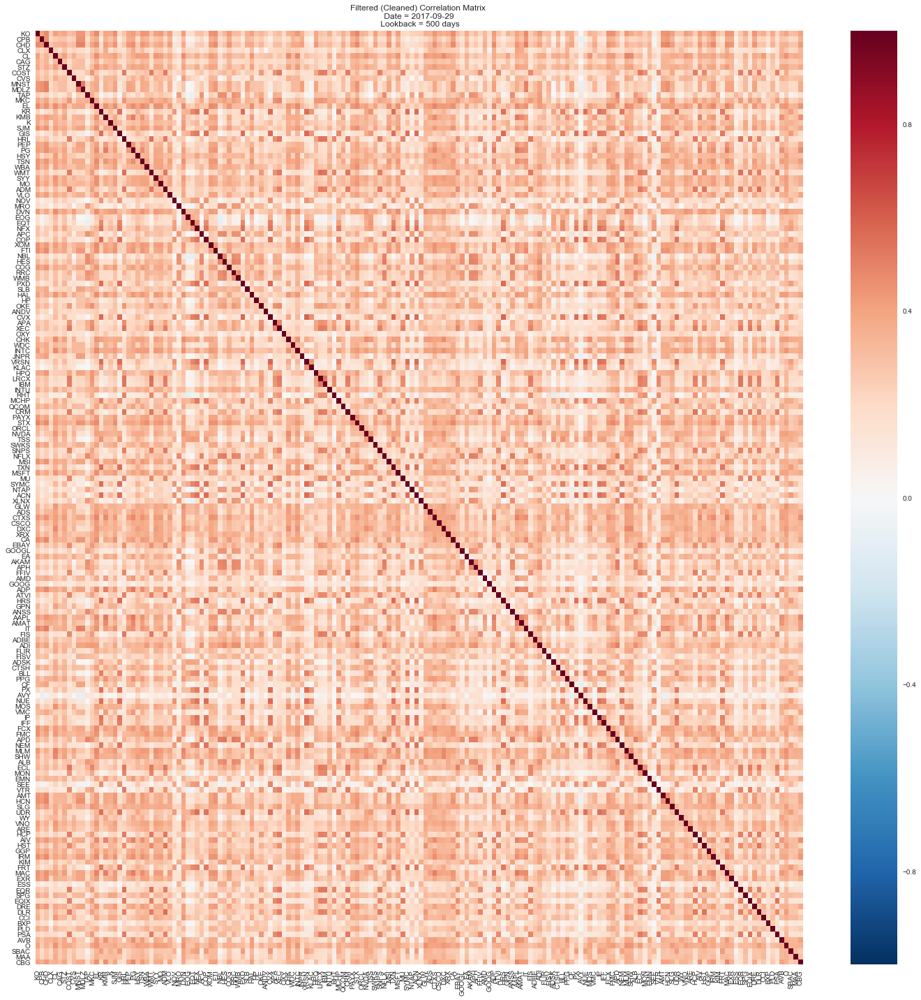

In [275]:
figureSize=(20,20)
plt.figure(figsize=figureSize)
plt.title('Filtered (Cleaned) Correlation Matrix \n Date = 2017-09-29 \n Lookback = 500 days')
ax = seaborn.heatmap(Z_clipped, 
    annot=False, yticklabels=instrumentTickerSorted.values,xticklabels=instrumentTickerSorted.values)
plt.tight_layout() 



### Principal Component Analysis (PCA)

In the previous section, we provided an overview of the application of Random Matrix Theory (RMT) in interpretting and cleaning correlation matrices. In this section we first provide a brief overview of the theory underlying statistical factor analysis of the equity price returns in our chosen stock universe.

The objective of principal component analysis (PCA) is to find a linear transformation $\Omega$ that maps a set of observed variables $\hat{R}$ into a set of uncorrelated variables $F$. We define the $I$ x $T$ statistical factor matrix as

$$F = \Omega\hat{R}$$

Where each row $f_{k}$ ($k = 1, \dots ,N$) corresponds to a factor $F$ of $\hat{R}$ and the transformation matrix $\Omega$ has elements $\omega_{k,i}$. The first row of $\omega_{1}$ (which contains the first set of factor coefficients or 'loadings') is chosen such that the first factor ($f_{1}$) is aligned with the direction of maximal variance in the $I$-dimensional space defined by $\hat{R}$. Each subsequent factor ($f_{k}$) accounts for as much of the remaining variance of the standardized returns $\hat{R}$ as possible, subject to the constraint that the $\omega_{k}$ are mutually orthogonal. The vectors $\omega_{k}$ are further constrained by requiring that $\omega_{k}\omega_{k}^{T}=1$ for all $k$.

The correlation matrix $Z$ is an $I$ x $I$ diagonalizable symmetric matrix that can be written in the form

$$Z = \frac{1}{T}EDE'$$

Where $D$ is a diagonal matrix of eigenvalues $d$ and $E$ is an orthogonal matrix of the corresponding eigenvectors.

The eigenvectors of the correlation matrix $Z$ correspond to the directions of maximal variance such that $\Omega=E'$. Statistical factors / principal components $F$ are found using the diagonalization above. 

If the sign of every coefficient in a statistical factor $f_{k}$ is reversed, neither the variance of $f_{k}$ nor the orthogonality of $\omega$ with respect to each of the other eigenvectors changes. For this reason, the signs of factors (PCs) are arbitrary. This feature of PCA can be problematic when we are interested in the temporal evolution of factors.

### Proportion of Variance
The covariance matrix $\Sigma_{F}$ for the statistical factor matrix $F$ can be written as:

$$\Sigma_{F}=\frac{1}{M}FF^{T}=\frac{1}{M}\Omega\hat{R}\hat{R}^{T} \Omega^{T} = D$$

Where $D$ is the diagonal matrix of eigenvalues $d$.

The total variance of the standardized returns $\hat{R}$ for the $I$ stocks is then

$$\sum_{i=1}^{I}\sigma^{2}(\hat{r}{i})=tr(\Sigma{\hat{R}})=\sum_{i=1}^{I}d_{i}=\sum_{i=1}^{N}\sigma^{2}(f_{i})=tr(D)=I$$

Where $\Sigma_{\hat{R}}$ is the covariance matrix for $\hat{R}$ 

$\sigma^{2}(\hat{r_{i}})=1$ is the variance of the vector $\hat{r_{i}}$ of standardized returns for investment $i$.

The proportion of the total variance in $\hat{R}$ explained by the $k^{th}$ factor is then

$$\frac{\sigma^{2}(f_{k})}{\Sigma_{i=1}^{I}\sigma^{2}(\hat{r_{i}})}=\frac{d_{k}}{\Sigma_{i=1}^{I}d_{k}}=\frac{d_{k}}{I}$$

The proportion of the variance from the $k^{th}$ factor is equal to the ratio of the $k^{th}$ largest eigenvalue $d_{k}$ to the number of investments $I$.

### Number of Significant Components

To determine how many statistical factors are needed to describe the correlations between investments, many methods have been proposed. There is no widespread agreement on an optimal approach. In this project, we focus primarily on the first factor where we are able to find a clear economic interpretation (i.e., the common equity market factor). We also compare the eigenvalues and eigenvectors of correlation matrices of instrument returns with the corresponding properties of correlation matrices for randomly-distributed returns [4,20–24]. In prior studies, most of the eigenvalues of return correlation matrices were found to lie within the ranges predicted by RMT, which is usually taken as an indication that to a large extent the correlation matrix is random and dominated by noise [4,20,21].


### Significant Statistical Factor Coefficients

An increase in the variance associated with a factor can be the result of increases in the correlations among only a few single stocks (which then have large factor coefficients) or an effect in which many single stocks make significant contributions to the factor. Since the two types of changes have very different implications for sytematic trading, this distinction is critically important. It becomes much more difficult to reduce risk by diversifying across different single stocks when correlations between all single stocks increase. In contrast, increases in correlations within a sector when correlations between different sectors are not increasing have a less significant impact on diversification.

### Inverse Participation Ratio (IPR)

The inverse participation ratio $IPR_{k}$ of the $k^{th}$ factor $\omega_{k}$ is defined as:

$$IPR_{k}=\sum_{i=1}^{I}\left( \omega_{k,i}\right)^{4}$$

The IPR quantifies the reciprocal of the number of elements that make a significant contribution to each eigenvector.

The behavior of the IPR is bounded by two cases:

1. An eigenvector with identical contributions $\omega_{k,i}=\frac{1}{\sqrt{I}}$ from all $I$ investments has $IPR_{k}=\frac{1}{I}$

2. An eigenvector with a single factor $\omega_{k,i}=1$ and remaining factors equal to zero has $IPR=1$

The inverse of the IPR - the so-called participation ratio - provides a more intuitive measure of the significance of a given factor as a large $PR$ indicates that many investments contribute to the factor, while a small $PR$ signals that few investments contribute to the factor:

$$PR = \frac{1}{IPR_{k}}$$

The participation ratio quantifies the number of eigenvector (loading) components that participate in a factor and provides a measure of concentration.

The bigger a $PR$ is, the more participants the statistical factor has, the more uniformly distributed the participation is, and the more correlations are driven by the statistical factor.

Participation ratios facilitate the identification of statistical factors that represent macroeconomic scenarios, namely those with many participants. They also help us identify factors that represent micro-economic scenarios, namely factors with few participants.


In [152]:
# define the inverse participation ratio (IPR)
def inverseParticipationRatio(k,omega):
  # find the IPR
  IPR=numpy.sum(omega[:,k]**4)
  # return the IPR
  return IPR

# define the participation ratio (PR)
def PR(k,omega):
  # find the IPR
  IPR=inverseParticipationRatio(k,omega)
  # take the inverse of the IPR
  PR=1/IPR
  # return the PR
  return PR

# 
def principalComponentAnalysis_Gics(gicsSectorCorrelations,dateTime,gicsSectorTickers):
    results=dict()
    # find number of tickers in sector (GICS)
    nInstruments=len(gicsSectorTickers)
    # extract the correlation matrix for the last date ('2017-09-15 00:00:00')
    gicsSector_C=gicsSectorCorrelations.loc[(dateTime, gicsSectorTickers)]
    # extract the correlation matrix to a numpy array
    rho=gicsSector_C.values 
    # compute the eigendecomposition
    eigenvalues,eigenvectors=numpy.linalg.eig(rho)
    # sort the eigenvalues and eigenvalues
    sortIndex=numpy.argsort(-eigenvalues)
    eigenvalues=eigenvalues[sortIndex]
    eigenvectors=eigenvectors[:,sortIndex]
    # compute proportion of variance
    proportionOfVariance=eigenvalues/len(eigenvalues)
    # compute explained variance
    explainedVariance=numpy.cumsum(proportionOfVariance)
    # create matrix to store results
    participationRatio=numpy.zeros([nInstruments,1])
    # iterate over each factor 
    for factorIndex in range(0,nInstruments):
        # compute participation ratio (PR)
        participationRatio[factorIndex]=PR(factorIndex,eigenvectors)        
    
    # create eigenvalues data frame
    eigenvaluesDf=pandas.DataFrame(eigenvalues,index=numpy.arange(1,nInstruments+1),
        columns=['eigenvalues'])
    # create eigenvectors data frame
    eigenvectorsDf=pandas.DataFrame(eigenvectors,index=gicsSectorTickers[sortIndex],
        columns=numpy.arange(1,nInstruments+1))
    # create proportion of variance data frame
    proportionOfVarianceDf=pandas.DataFrame(proportionOfVariance,index=numpy.arange(1,nInstruments+1),
        columns=['proportionOfVariance'])
    # create explained variance data frame
    explainedVarianceDf=pandas.DataFrame(explainedVariance,index=numpy.arange(1,nInstruments+1),
        columns=['explainedVariance'])
    # create participation ratio data frame
    participationRatioDf=pandas.DataFrame(participationRatio,index=numpy.arange(1,nInstruments+1),
        columns=['participationRatio'])    
    
    # store results
    results['sortIndex']=sortIndex
    # store eigenvalues
    results['eigenvalues']=eigenvaluesDf
    # store eigenvectors
    results['eigenvectors']=eigenvectorsDf
    # store proportion of variance
    results['proportionOfVariance']=proportionOfVarianceDf
    # store explained variance
    results['explainedVariance']=explainedVarianceDf
    # store participation ratio
    results['participationRatio']=participationRatioDf
    
    return results

def plotFactorLoadings(eigenvectorsDf,factorNumber,absFlag=True,figureSize=(15,3)):
    # set figure size
    plt.figure(figsize=figureSize)
    # if flag set to True
    if (absFlag):
        # plot absolute value of eigenvectors 
        eigenvectorsDf[factorNumber].abs().plot('bar')
    else:
        # plot eigenvectors
        eigenvectorsDf[factorNumber].plot('bar')
    # add x-label
    plt.xlabel('Instrument Ticker')
    # add y-label
    plt.ylabel('abs(Factor Loading)')
    # add title
    plt.title('Eigenvector (#'+str(factorNumber)+')')    
    
    return

def plotProportionOfVariance(proportionOfVarianceDf,figureSize=(15,3)):
    # set figure size
    plt.figure(figsize=figureSize)
    # plot proportion of variance
    proportionOfVarianceDf['proportionOfVariance'].plot('bar')
    # add x-label
    plt.xlabel('Factor (#)')
    # add y-label
    plt.ylabel('Proportion Of Variance')
    # add title
    plt.title('Proportion of Variance Explained By Factor')    
    
    return

def plotExplainedVariance(explainedVarianceDf,figureSize=(15,3)):
    # set figure size
    plt.figure(figsize=figureSize)
    # plot explained variance
    explainedVarianceDf['explainedVariance'].plot('line')
    # add x-label
    plt.xlabel('Factor (#)')
    # add y-label
    plt.ylabel('Cumulative Proportion Of Variance')
    # add title
    plt.title('Cumulative Proportion of Variance Explained By Factor')

    return

def plotParticipationRatio(participationRatioDf,figureSize=(15,3)):
    # set figure size
    plt.figure(figsize=figureSize)
    # plot participation ratio
    participationRatioDf['participationRatio'].plot('bar')
    # add x-label
    plt.xlabel('Factor (#)')
    # add y-label
    plt.ylabel('Participation Ratio')
    # add title
    plt.title('Participation Ratio By Factor')    
    
    return

def flattenMatrixDf(df,dateTime):
    # flatten matrix
    flatSeries=df.unstack()
    # convert series to data frame
    flatDf=flatSeries.to_frame()
    # add as-of date to data frame
    flatDf.insert(0, 'asOfDate', dateTime)
    # return flat data frame   
    return flatDf

def unflattenMatrixDf(df,dateTime):
    # covert flat data frame back to matrix data frame
    df=flatDf[0].unstack(level=0)
    return flatDf

def plotProportionOfVarianceByDate(proportionOfVariancePanel,factorNumber,cumulativeFlag=False,figureSize=(15,3),legendFlag=True):
    # rearrange to date-by-proportion of variance
    df=proportionOfVariancePanel['proportionOfVariance'].T
    # compute cumulative proportion of variance
    cumulativeDf=df.cumsum(axis=1)
    
    if (cumulativeFlag):
        # plot cumulative proportion of variance
        cumulativeDf[factorNumber].plot(figsize=figureSize,legend=legendFlag)
        # add y-label
        plt.ylabel('Cumulative Proportion Of Variance')
        # add title
        plt.title('Cumulative Proportion of Variance Explained By Factor(s) (1-'+str(factorNumber)+')')

    else:
        # plot proportion of variance
        df[factorNumber].plot(figsize=figureSize,legend=legendFlag)
        # add y-label
        plt.ylabel('Proportion Of Variance')
        # add title
        plt.title('Proportion of Variance Explained By Factor (#'+str(factorNumber)+')')
    
    return

# resultsByDate=topologicalAnalysisByDate(gicsSectorCorrelations,instrumentMaster,subIndustry2Color,ticker2SubIndustry,lookback)
def pcaByDateWeekly(gicsSectorCorrelations,instrumentMaster,subIndustry2Color,ticker2SubIndustry,lookback):
    # extract datetimes
    dateTimes=gicsSectorCorrelations.index.levels[0]
    # extract GICs sector tickers
    gicsSectorTickers=gicsSectorCorrelations.index.levels[1].values
    
    # create weekly index (each Friday)
    weeklyIndex=gicsSectorCorrelations.index.levels[0].dayofweek==4
    # extract weekly datetimes
    weeklyDateTimes=dateTimes[weeklyIndex]    
    
    # create dictionary to store 'by-date' output
    resultsByDate=dict()
    # create dictionary to store eigenvalues by date    
    eigenvaluesByDate=dict()

    # create dictionary to store participation ratio by date
    participationRatioByDate=dict()
    # create dictionary to store proportion of variance by date
    proportionOfVarianceByDate=dict()
#    # create dictionary to store flat eigenvectors by date
#    flatEigenvectorsByDate=dict()
#    # create dictionary to store PCA by date
#    pcaByDate=dict()
    # initialize date count
    dateCount=0
    # iterate over each date
    for dateTime in weeklyDateTimes:
        # increment date count
        dateCount=dateCount+5
        #print(dateTime)
        # if date count is greater than or equal to lookback
        if (dateCount >= lookback):
    
            try:
                # do PCA
                results=principalComponentAnalysis_Gics(gicsSectorCorrelations,dateTime,gicsSectorTickers)
#                # extract eigenvectors
#                eigenvectorsDf=results['eigenvectors']
#                # flatten eigenvectors
#                flatEigenvectorsDf=flattenMatrixDf(eigenvectorsDf,dateTime)
#                # store flat eigenvectors for date
#                flatEigenvectorsByDate[dateTime]=flatEigenvectorsDf
                # store flat eigenvalues for date
                eigenvaluesByDate[dateTime]=results['eigenvalues']
                # store proportion of variance for date
                proportionOfVarianceByDate[dateTime]=results['proportionOfVariance']
                # store participation ratio for date
                participationRatioByDate[dateTime]=results['participationRatio']
            
#                # store PCA results
#                pcaByDate[dateTime]=results
            
            #
            except:
                pass
                #print('problem processing dateTime:'+str(dateTime))

    # build output structure for 'by-date' metrics
    resultsByDate['eigenvaluesByDate']=eigenvaluesByDate
    resultsByDate['proportionOfVarianceByDate']=proportionOfVarianceByDate
    resultsByDate['participationRatioByDate']=participationRatioByDate

    return resultsByDate



In [153]:
# ticker2Sector=buildTicker2Sector(tickers,gicsSectorName)
def buildTicker2Sector(tickers,gicsSectorName):
    # create dictionary
    ticker2Sector=dict()
    # iterate over each ticker
    for i in range(0,len(tickers)):
        # extract ticker
        ticker=tickers[i]
        # extract sector
        sector=gicsSectorName[i]
        # add sector by ticker
        ticker2Sector[ticker]=sector
    
    return ticker2Sector

# sector2Color=buildSector2Color(gicsSectorName)
def buildSector2Color(gicsSectorName):
    # find unique sectors
    uniqueGicsSectorName=numpy.unique(gicsSectorName)
    # find number of sectors
    nGicsSector=len(uniqueGicsSectorName)
    # set color map
    colorList=seaborn.color_palette("RdBu_r", nGicsSector)
    # define dictionary mapping sector to color
    sector2Color=dict()
    # iterate over sector
    for iSector in range(0,nGicsSector):
        # assign color for sector
        sector2Color[uniqueGicsSectorName[iSector]]=colorList[iSector]
    
    return sector2Color

# ticker2SubIndustry=buildTicker2SubIndustry(gicsSectorTickers,sector_gicsSubIndustryName)
def buildTicker2SubIndustry(gicsSectorTickers,sector_gicsSubIndustryName):
    # create dictionary
    ticker2SubIndustry=dict()
    # iterate over each ticker
    for i in range(0,len(gicsSectorTickers)):
        # extract ticker
        ticker=gicsSectorTickers[i]
        # extract sub-industry
        subIndustry=sector_gicsSubIndustryName[i]
        # add sub-industry by ticker
        ticker2SubIndustry[ticker]=subIndustry
    
    return ticker2SubIndustry

# subIndustry2Color=buildSubIndustry2Color(sector_gicsSubIndustryName)
def buildSubIndustry2Color(sector_gicsSubIndustryName):
    # find unique sub-industries within sector
    unique_sector_gicsSubIndustryName=numpy.unique(sector_gicsSubIndustryName)
    # find number of sub-industries within sector
    nGicsSubIndustry=len(unique_sector_gicsSubIndustryName)
    # set color map
    colorList=seaborn.color_palette("RdBu_r", nGicsSubIndustry)
    # define dictionary mapping sub-industry to color
    subIndustry2Color=dict()
    # define sub-industry n
    nGicsSubIndustry=len(unique_sector_gicsSubIndustryName)
    # iterate over sub-industry
    for iSubIndustry in range(0,nGicsSubIndustry):
        # assign color for sub-industry
        subIndustry2Color[unique_sector_gicsSubIndustryName[iSubIndustry]]=colorList[iSubIndustry]
    
    return subIndustry2Color

# gicsSector_G=correlationNetwork_Gics(gicsSectorCorrelations,dateTime,gicsSectorTickers,subIndustry2Color,ticker2SubIndustry)
def correlationNetwork_Gics(gicsSectorCorrelations,dateTime,gicsSectorTickers,subIndustry2Color,ticker2SubIndustry,lookback,filterFlag=False):
    
    # find number of tickers in sector (GICS)
    nGicsSectorInstruments=len(gicsSectorTickers)
    # create correlation graph
    gicsSector_G=networkx.Graph()

    # number of periods
    nPeriods=len(gicsSectorCorrelations)
    # extract the correlation matrix for the last date ('2017-09-15 00:00:00')
    gicsSector_C=gicsSectorCorrelations.loc[(dateTime, gicsSectorTickers)]
    # extract the correlation matrix to a numpy array
    rho=gicsSector_C.values
    
    # if filter flag is set to True 
    if (filterFlag):
        # find RMT-based upper and lower eigenvalue bounds
        (lambda_min, lambda_max), fRho=marcenkoPasturC(lookback,nGicsSectorInstruments)
        # filter correlation matrix
        rho=correlationFiltered(rho,lookback,nGicsSectorInstruments)
        
    # check if correlation matrix is positive-definite (PD)
    pdFlag=isPD(rho)
    # if not PD, find nearest PD correlation matrix
    if (pdFlag==False):
        rho=nearestPD(rho)
    
    # iterate over each instrument
    for i in range(0,nGicsSectorInstruments):
        # define ticker [i]
        iTicker=gicsSectorTickers[i]
        # iterate over each instrument
        for j in range(0,nGicsSectorInstruments):
            # define ticker [j]
            jTicker=gicsSectorTickers[j]
            if (rho[i,j] > 1):
                # compute distance
                metricDistance=math.sqrt(2.0*(1.0-1.0))
            elif (rho[i,j] < -1):
                metricDistance=math.sqrt(2.0*(1.0--1.0))
            else:
                metricDistance=math.sqrt(2.0*(1.0-rho[i,j]))
                
#            metricDistance=math.sqrt(2.0*(1.0-rho[i,j]))
            # build network
            gicsSector_G.add_edge(iTicker,jTicker,weight=metricDistance)

    # set color attributes for network nodes
    for n in gicsSector_G.nodes():
        gicsSector_G.node[n]['color']=subIndustry2Color[ticker2SubIndustry[n]]    
    
    return gicsSector_G

# plotCorrelationNetwork_Gics(gicsSector_G,gicsSectorName,subIndustry2Color,figureSize)
def plotCorrelationNetwork_Gics(gicsSector_G,gicsSectorName,subIndustry2Color,figureSize):
    # define title
    titleName='Log-Return Correlation Network - '+gicsSectorName
    # set figure size
    plt.figure(figsize=figureSize)
    # add title
    plt.title(titleName)
    # determine the positions using spring layout
    gicsSector_position=networkx.spring_layout(gicsSector_G,iterations=500,scale=10.0)

    # add nodes
    for n in gicsSector_G.nodes():
        networkx.draw_networkx_nodes(gicsSector_G, gicsSector_position, 
        [n], node_size = 600,node_color=gicsSector_G.node[n]['color'],
        with_labels=True,alpha=0.75)

    # add edges
    networkx.draw_networkx_edges(gicsSector_G,pos=gicsSector_position,
        edge_color='grey',alpha=0.25,width=2)

    # add labels
    networkx.draw_networkx_labels(gicsSector_G,pos=gicsSector_position,
        font_size=8)
    # remove axis
    plt.axis('off')
    # add legend
    legend_color_patch=list()
    # iterate over sub-industry and create patches
    for subIndustryName in subIndustry2Color.keys():
        subIndustryColor=subIndustry2Color[subIndustryName]
        color_patch=mpatches.Patch(color=subIndustryColor, 
            label=subIndustryName)
        legend_color_patch.append(color_patch)
    # add legend
    plt.legend(handles=legend_color_patch)
    # set tight layout
    plt.tight_layout()
    # display the graph
    plt.show()    
    
    return

# gicsSector_tree_graph=minimalSpanningTree_Gics(gicsSector_G,gicsSectorTickers,subIndustry2Color,ticker2SubIndustry)
def minimalSpanningTree_Gics(gicsSector_G,gicsSectorTickers,subIndustry2Color,ticker2SubIndustry):

    gicsSector_tree_seed=gicsSectorTickers[0]
    gicsSector_N_new=[]
    gicsSector_E_new=[]
    gicsSector_N_new.append(gicsSector_tree_seed)
    while len(gicsSector_N_new) < gicsSector_G.number_of_nodes():
        min_weight=10000000.0
        for n in gicsSector_N_new:
            for n_adj in gicsSector_G.neighbors(n):
                if not n_adj in gicsSector_N_new:
                    if gicsSector_G[n][n_adj]['weight'] < min_weight:
                        min_weight=gicsSector_G[n][n_adj]['weight']
                        min_weight_edge=(n,n_adj)
                        n_adj_ext=n_adj
        gicsSector_E_new.append(min_weight_edge)
        gicsSector_N_new.append(n_adj_ext)
    
    # generate tree from edge list
    gicsSector_tree_graph=networkx.Graph()
    gicsSector_tree_graph.add_edges_from(gicsSector_E_new)

    # set color attributes for network nodes
    for n in gicsSector_tree_graph.nodes():
        gicsSector_tree_graph.node[n]['color']=subIndustry2Color[ticker2SubIndustry[n]]
    
    return gicsSector_tree_graph

from networkx.drawing.nx_agraph import graphviz_layout

# plotMinimalSpanningTree_Gics(gicsSector_tree_graph,gicsSectorName,subIndustry2Color,figureSize)
def plotMinimalSpanningTree_Gics(gicsSector_tree_graph,gicsSectorName,subIndustry2Color,figureSize):

    # create position
    #gicsSector_pos=networkx.spring_layout(gicsSector_tree_graph,iterations=500,scale=10.0)
    gicsSector_pos=graphviz_layout(gicsSector_tree_graph,prog='neato')

    # define title
    titleName='Log-Return Correlation Network Minimum Spanning Tree - '+gicsSectorName
    # set figure size
    plt.figure(figsize=figureSize)
    # add title
    plt.title(titleName)
    # add edges
    networkx.draw_networkx_edges(gicsSector_tree_graph,gicsSector_pos,width=2, 
        edge_color='black', alpha=0.75, style="solid")
    # add labels
    networkx.draw_networkx_labels(gicsSector_tree_graph,gicsSector_pos)
    # add nodes
    for n in gicsSector_tree_graph.nodes():
        networkx.draw_networkx_nodes(gicsSector_tree_graph, gicsSector_pos, 
        [n], node_size = 600,node_color=gicsSector_tree_graph.node[n]['color'],
        with_labels=True,alpha=0.75)
    # remove axis
    plt.axis('off')
    # add legend
    legend_color_patch=list()
    # iterate over sub-industry and create patches
    for subIndustryName in subIndustry2Color.keys():
        subIndustryColor=subIndustry2Color[subIndustryName]
        color_patch=mpatches.Patch(color=subIndustryColor, 
        label=subIndustryName)
        legend_color_patch.append(color_patch)
    # add legend
    plt.legend(handles=legend_color_patch)
    # set tight layout
    plt.tight_layout()
    # display the graph
    plt.show()    
    
    return

def degreeByInstrument(G,instrumentMaster):
    # compute weighted degree
    degreeByInstrument=networkx.degree(G,weight='weight')
    # convert degree dictionary to dataframe
    degreeByInstrumentDf=pandas.DataFrame.from_dict(degreeByInstrument,
        orient='index')
    # rename column
    degreeByInstrumentDf.rename(columns={0 : 'degree'},inplace=True)
    # join degree and instrument master (by ticker)
    degreeByInstrumentTable=pandas.merge(degreeByInstrumentDf, instrumentMaster, 
        how='inner', left_index=True, right_on='instrumentTicker')
    # set index to instrument ticker
    degreeByInstrumentTable.set_index(keys=['instrumentTicker'],inplace=True)    
    
    return degreeByInstrumentTable

# topologicalAnalysisByDateWeekly_U(gicsSectorCorrelations,instrumentMaster,subIndustry2Color,ticker2SubIndustry,lookback)
def topologicalAnalysisByDateWeekly_U(gicsSectorCorrelations,instrumentMaster,subIndustry2Color,ticker2SubIndustry,lookback):
    # extract datetimes
    dateTimes=gicsSectorCorrelations.index.levels[0]
    # extract GICs sector tickers
    gicsSectorTickers=gicsSectorCorrelations.index.levels[1].values
    
    # create weekly index (each Friday)
    weeklyIndex=gicsSectorCorrelations.index.levels[0].dayofweek==4
    # extract weekly datetimes
    weeklyDateTimes=dateTimes[weeklyIndex]    
    
    # create dictionary to store 'by-date' output
    resultsByDate=dict()
#    # create dictionary to store graphs by date
#    graphsByDate=dict()
    # create dictionary to store degree by date (unfiltered)
    degreeByInstrumentByDate_U=dict()
    # create dictionary to store degree by date (MST) (unfiltered)
    degreeByInstrumentByDateMST_U=dict()

    # initialize date count
    dateCount=0
    # iterate over each date
    for dateTime in weeklyDateTimes:
        # increment date count
        dateCount=dateCount+5
        #print(dateTime)
        # if date count is greater than or equal to lookback
        if (dateCount >= lookback):
    
            try:
                # create dictionary to store results by type for date
#                graphs=dict()
            
                # set filter flag
                filterFlag=False
                # build correlation network (unfiltered)
                gicsSector_G_U=correlationNetwork_Gics(gicsSectorCorrelations,dateTime,
                    gicsSectorTickers,subIndustry2Color,ticker2SubIndustry,lookback,filterFlag)
                # build minimal spanning tree (unfiltered)
                gicsSector_tree_graph_U=minimalSpanningTree_Gics(gicsSector_G_U,gicsSectorTickers,
                    subIndustry2Color,ticker2SubIndustry)
            
#                # store correlation network by type (unfiltered)
#                graphs['gicsSector_G_U']=gicsSector_G_U
#                # store minimal spanning tree by type (unfiltered)
#                graphs['gicsSector_tree_graph_U']=gicsSector_tree_graph_U
#                # store by date
#                graphsByDate[dateTime]=graphs
            
                # compute degree by instrument (unfiltered)
                degreeByInstrumentTable_U=degreeByInstrument(gicsSector_G_U,instrumentMaster)
                # compute degree by instrument (MST) (unfiltered)
                degreeByInstrumentTableMST_U=degreeByInstrument(gicsSector_tree_graph_U,instrumentMaster)
                # store degree by instrument for date (unfiltered)
                degreeByInstrumentByDate_U[dateTime]=degreeByInstrumentTable_U
                # store degree by instrument for date (MST) (unfiltered)
                degreeByInstrumentByDateMST_U[dateTime]=degreeByInstrumentTableMST_U
            
            #
            except:
                pass
                #print('problem processing dateTime:'+str(dateTime))

    # build output structure for 'by-date' metrics
#    resultsByDate['graphsByDate']=graphsByDate
    resultsByDate['degreeByInstrumentByDate_U']=degreeByInstrumentByDate_U
    resultsByDate['degreeByInstrumentByDateMST_U']=degreeByInstrumentByDateMST_U

    return resultsByDate

# topologicalAnalysisByDateWeekly_F(gicsSectorCorrelations,instrumentMaster,subIndustry2Color,ticker2SubIndustry,lookback)
def topologicalAnalysisByDateWeekly_F(gicsSectorCorrelations,instrumentMaster,subIndustry2Color,ticker2SubIndustry,lookback):
    # extract datetimes
    dateTimes=gicsSectorCorrelations.index.levels[0]
    # extract GICs sector tickers
    gicsSectorTickers=gicsSectorCorrelations.index.levels[1].values
    
    # create weekly index (each Friday)
    weeklyIndex=gicsSectorCorrelations.index.levels[0].dayofweek==4
    # extract weekly datetimes
    weeklyDateTimes=dateTimes[weeklyIndex]    
    
    # create dictionary to store 'by-date' output
    resultsByDate=dict()
#    # create dictionary to store graphs by date
#    graphsByDate=dict()

    # create dictionary to store degree by date (filtered)
    degreeByInstrumentByDate_F=dict()
    # create dictionary to store degree by date (MST) (filtered)
    degreeByInstrumentByDateMST_F=dict()

    # initialize date count
    dateCount=0
    # iterate over each date
    for dateTime in weeklyDateTimes:
        # increment date count
        dateCount=dateCount+5
        #print(dateTime)
        # if date count is greater than or equal to lookback
        if (dateCount >= lookback):
    
            try:
                # create dictionary to store results by type for date
#                graphs=dict()

                # set filter flag
                filterFlag=True
                # build correlation network (filtered)
                gicsSector_G_F=correlationNetwork_Gics(gicsSectorCorrelations,dateTime,
                    gicsSectorTickers,subIndustry2Color,ticker2SubIndustry,lookback,filterFlag)
                # build minimal spanning tree (filtered)
                gicsSector_tree_graph_F=minimalSpanningTree_Gics(gicsSector_G_F,gicsSectorTickers,
                    subIndustry2Color,ticker2SubIndustry)
            
#                # store correlation network by type (filtered)
#                graphs['gicsSector_G_F']=gicsSector_G_F
#                # store minimal spanning tree by type (filtered)
#                graphs['gicsSector_tree_graph_F']=gicsSector_tree_graph_F
#                # store by date
#                graphsByDate[dateTime]=graphs

                # compute degree by instrument (filtered)
                degreeByInstrumentTable_F=degreeByInstrument(gicsSector_G_F,instrumentMaster)
                # compute degree by instrument (MST) (filtered)
                degreeByInstrumentTableMST_F=degreeByInstrument(gicsSector_tree_graph_F,instrumentMaster)
                # store degree by instrument for date (filtered)
                degreeByInstrumentByDate_F[dateTime]=degreeByInstrumentTable_F
                # store degree by instrument for date (MST) (filtered)
                degreeByInstrumentByDateMST_F[dateTime]=degreeByInstrumentTableMST_F
            
            #
            except:
                pass
                #print('problem processing dateTime:'+str(dateTime))

    # build output structure for 'by-date' metrics
#    resultsByDate['graphsByDate']=graphsByDate
    resultsByDate['degreeByInstrumentByDate_F']=degreeByInstrumentByDate_F
    resultsByDate['degreeByInstrumentByDateMST_F']=degreeByInstrumentByDateMST_F

    return resultsByDate


# ticker2SubIndustry=buildTicker2SubIndustry(gicsSectorTickers,sector_gicsSubIndustryName)
# subIndustry2Color=buildSubIndustry2Color(sector_gicsSubIndustryName)
# gicsSector_G=correlationNetwork_Gics(gicsSectorCorrelations,dateTime,gicsSectorTickers,subIndustry2Color,ticker2SubIndustry)
# gicsSector_G=correlationNetwork_Gics(gicsSectorCorrelations,dateTime,gicsSectorTickers,subIndustry2Color,ticker2SubIndustry)
# plotCorrelationNetwork_Gics(gicsSector_G,gicsSectorName,subIndustry2Color,figureSize)
# gicsSector_tree_graph=minimalSpanningTree_Gics(gicsSector_G,subIndustry2Color,ticker2SubIndustry)
# plotMinimalSpanningTree_Gics(gicsSector_tree_graph,gicsSectorName,subIndustry2Color,figureSize)


###  Correlation Networks

Using log-return correlation we obtain a set of $I \times (I-1)/2$ numbers characterizing the similarity of any of the $I$ instruments with respect to all the other $I-1$ instruments. This set of numbers forms a complete graph with different edge strengths given by the correlation value. To every entry of the correlation matrix, we can associate a metric distance between any pair of instruments by defining

$$d_{i,j}=\sqrt{2(1-z_{i,j})}$$

$d_{i,j}$ fulfils the following three axioms of a metric distance:

1. $d_{i,j}=0$ if and only if $i=j$;

2. $d_{i,j}=d_{i,j} \forall i,j$;

3. $d_{i,j} \le d_{i,k} + d_{k,j} \forall i,j,k$

This distance matrix $D$ will be used in the next section to determine the Minimum Spanning Tree (MST) connecting each of the $I$ stocks in the instrument universe under study.


### Minimum Spanning Tree

Constructed based on the so-called 'nearest neighbour single linkage nodes algorithm', a minimum spanning tree (MST) is a subset of the edges of a connected, edge-weighted undirected graph that connects all the nodes (vertices) together without any cycles, in such a way as to minimize total edge weight. 

Informally, Prim's algorithm for constructing the minimum spanning tree is as follows:

1. Initialize a tree with a single - arbitrarily chosen - node (vertex) from the graph.

2. Grow the tree by one edge: find the minimum-weight edge among the edges that connect the tree to nodes (vertices) not yet in the tree, and add it to the tree.

3. Repeat step 2 until all nodes (vertices) are in the tree.

In the following section, we filter the correlation network using Prim's algorithm to create the minimal spanning tree (MST).

We create the minimal spanning tree (MST) representation of both the unfiltered and the RMT-based filtered stock correlation networks and create graphs at roughly yearly intervals to visualize the evolution of the hierarchical relationships between the stocks in the instrument universe under study.

## IV Application - Behaviour of US Single Stock Return Correlations

In this section, we aim to find simple measures that can provide insight into the temporal dynamics of the relationships between single stocks under study. We begin by examining metrics derived from the eigenvalues and eigenvectors of rolling return correlations. Next we explore visualizations of the minimal spanning trees associated with the rolling return correlations for a relatively small set of historical dates. Finally, we conclude the section by examining topological metrics derived from the minimal spanning tree representation of rolling return correlation networks.




### Time-Varying Properties Derived from the Eigenvalues and Eigenvectors of the Return Correlation Matrix

In this sub-section, we focus on the time evolution of a number of metrics summarizing the time-varying properties derived from the eigenvalues and eigenvectors of the rolling return correlation matrice, and the topological properties of the Minimal Spanning Trees (MSTs) derived from those correlations. We aim to find simple measures that can provide insight into the temporal dynamics of the relationships beteen single stocks under study.

In [154]:
# extract instrument tickers
instrumentTickers=subsetInstrumentMaster['instrumentTicker'].values
# extract instrument names
instrumentNames=subsetInstrumentMaster['instrumentName'].values
# extract GICs sub-industry names
gicsSectorNames=subsetInstrumentMaster['gicsSectorName'].values
# build ticker to sector map
ticker2Sector=buildTicker2Sector(instrumentTickers,gicsSectorNames)
# build sector to color map
sector2Color=buildSector2Color(gicsSectorNames)

In [155]:

if (computeRollingPCA):
    # start timer (compute rolling correlation)
    ts_computeRollingPCA = timer()   

    # rolling PCA
    resultsByDatePCA=pcaByDateWeekly(rollingCorrelation,subsetInstrumentMaster,
        sector2Color,ticker2Sector,lookback)
    # extract eigenvalues by date
    eigenvaluesByDate=resultsByDatePCA['eigenvaluesByDate']
    # extract proportion of variance by date
    proportionOfVarianceByDate=resultsByDatePCA['proportionOfVarianceByDate']
    # extract participation ratio by date
    participationRatioByDate=resultsByDatePCA['participationRatioByDate']

    # convert eigenvalues by date dictionary to panel
    eigenvaluesByDatePanel=pandas.Panel.from_dict(eigenvaluesByDate,
        orient='minor')
    # convert proportion of variance by date dictionary to panel
    proportionOfVariancePanel=pandas.Panel.from_dict(proportionOfVarianceByDate,
        orient='minor')
    # convert participation ratio by date dictionary to panel
    participationRatioByDatePanel=pandas.Panel.from_dict(participationRatioByDate,
        orient='minor')

    # create the HDF5 data store for eigenvalues by date
    eigenvaluesByDatePanel.to_hdf(outputDirectory+'eigenvaluesByDate_subset.h5',
        'eigenvaluesByDatePanel')    
    # create the HDF5 data store for proportion of variance by date
    proportionOfVariancePanel.to_hdf(outputDirectory+'proportionOfVarianceByDate_subset.h5',
        'proportionOfVarianceByDatePanel')
    # create the HDF5 data store for participation ratio by date
    participationRatioByDatePanel.to_hdf(outputDirectory+'participationRatioByDate_subset.h5',
        'participationRatioByDatePanel')

    # end timer (compute rolling correlation)
    te_computeRollingPCA = timer()
    
    # compute time elasped
    timeElasped_computeRollingPCA=te_computeRollingPCA-ts_computeRollingPCA
    
    # display time elasped
    print('Time Elasped: '+str(timeElasped_computeRollingPCA))

else:
    # read eigenvalues by date panel from the HDF5 results store
    eigenvaluesByDatePanel = pandas.read_hdf(outputDirectory+'eigenvaluesByDate_subset.h5',
        'eigenvaluesByDatePanel')    
    # read proportion of variance by date panel from the HDF5 results store
    proportionOfVariancePanel = pandas.read_hdf(outputDirectory+'proportionOfVarianceByDate_subset.h5',
        'proportionOfVarianceByDatePanel')
    # read participation ratio by date panel from the HDF5 results store
    participationRatioByDatePanel = pandas.read_hdf(outputDirectory+'participationRatioByDate_subset.h5',
        'participationRatioByDatePanel')    


C:\Users\Derek\Anaconda2\lib\site-packages\ipykernel_launcher.py:18: DeprecationWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.



Time Elasped: 6.64559281156


C:\Users\Derek\Anaconda2\lib\site-packages\ipykernel_launcher.py:21: DeprecationWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.

C:\Users\Derek\Anaconda2\lib\site-packages\ipykernel_launcher.py:24: DeprecationWarning: 
Panel is deprecated and will be removed in a future version.
The recommended way to represent these types of 3-dimensional data are with a MultiIndex on a DataFrame, via the Panel.to_frame() method
Alternatively, you can use the xarray package http://xarray.pydata.org/en/stable/.
Pandas provides a `.to_xarray()` method to help automate this conversion.



In [156]:
# extract eigenvalues by factor by date
eigenvaluesByFactorByDate=eigenvaluesByDatePanel['eigenvalues'].T
# significant large eigenvalues
significantLargeEigenvalueFlag=eigenvaluesByFactorByDate>lambdaMaxTheoretical
# find significant small eigenvalues
significantSmallEigenvalueFlag=eigenvaluesByFactorByDate<lambdaMinTheoretical
# count number of significant large eigenvalues
nSignificantLargeEigenvalue=significantLargeEigenvalueFlag.sum(axis=1)
# count number of significant small eigenvalues
nSignificantSmallEigenvalue=significantSmallEigenvalueFlag.sum(axis=1)

By comparing the eigenvalues of our actual rolling return correlation matrices with those obtained from random return correlation matrices, we can highlight the number of both large and small eigenvalues that likely have non-random structure.

#### Number of Statistically Significant Factors (Large Eigenvalues)

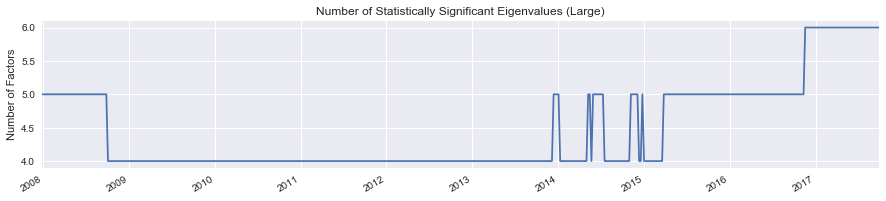

In [157]:
# set figure size
figureSize=(15,3)
# create plot
plt.figure(figsize=figureSize)
nSignificantLargeEigenvalue.plot()
plt.title('Number of Statistically Significant Eigenvalues (Large)')
plt.ylabel('Number of Factors')

Over the period under study, somewhere between 4 and 6 factors appear statistically significant when compared to the eigenvalues of correlation matrices obtained from random returns. We expect that the eigenvectors corresponding to the significant large eigenvalues contain useful information about common trends in different groups of stocks.

Similarly, we can search for indications of non-random structure in the small eigenvalues.

#### Number of Statistically Significant Factors (Small Eigenvalues)

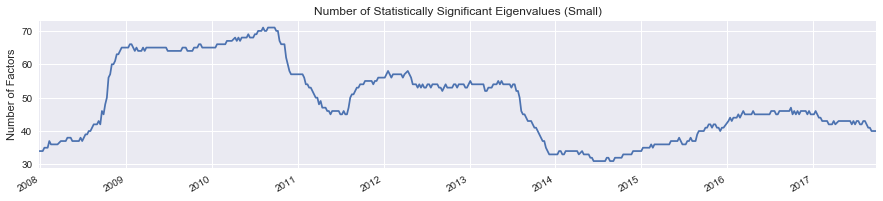

In [158]:
# create plot
# set figure size
figureSize=(15,3)
plt.figure(figsize=figureSize)
#nSignificantSmallEigenvaluePercent=nSignificantSmallEigenvalue/nInstrumentsSubset
nSignificantSmallEigenvalue.plot()
plt.title('Number of Statistically Significant Eigenvalues (Small)')
plt.ylabel('Number of Factors')

We observe a large number of small eigenvalues whose associated eigenvectors can likely help us sift out groups of stocks ideal for constructing mean-reversion strategies.

#### Proportion of Variance Explained By Factor (#1)

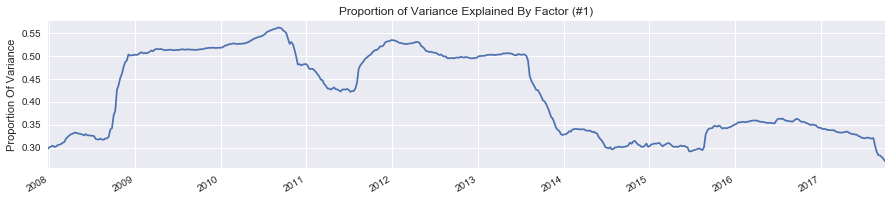

In [159]:
# set figure size
figureSize=(15,3)
# set factor number
factorNumber=1
# set cumulative flag
cumulativeFlag=False
# set legend flag
legendFlag=False
# plot proportion of variance by date
plotProportionOfVarianceByDate(proportionOfVariancePanel,factorNumber,cumulativeFlag,
    figureSize,legendFlag)

The proportion of variance explained by the first factor spikes in 2008 following the bankruptcy of Lehman Brothers on 2008-09-16, then continues to rise throughout 2009, 2010, and 2011, reversing only after mid-2011. This represents a precipitous decline in the level of diversity available the universe under study that persists until mid-2013. In the second half of 2013 we see a sharp and persistent decline in the proportion of variance explained by the first statistical factor that levels off at pre-crisis levels in mid-2014. In the second half of 2015 we observe a sudden jump to early 2014 levels. The proxy for diversity remains at those levels until late 2016, after which the trend turns down, hitting 10-year lows in late 2017.


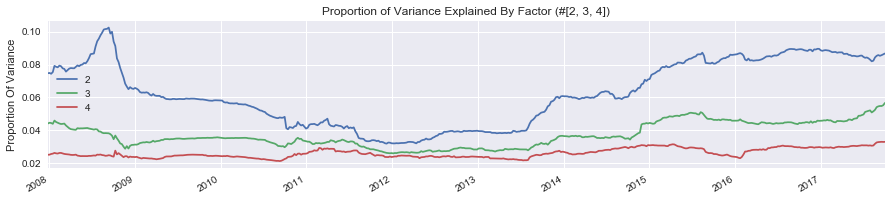

In [160]:
# set figure size
figureSize=(15,3)
# set factor number
factorNumber=[2,3,4]
# set cumulative flag
cumulativeFlag=False
# set legend flag
legendFlag=True
# plot proportion of variance by date
plotProportionOfVarianceByDate(proportionOfVariancePanel,factorNumber,cumulativeFlag,
    figureSize,legendFlag)

We observe a marked decline in the proportion of variance explained by the second statistical factor beginning with the bankruptcy filing of Lehman Brothers that persists until the beginning of 2013. In mid-2013 the proportion of variance explained by the second, third, and fourth statistical factors begins to rise. In mid-2015 the importance of the second statistical factor returns to its pre-crisis levels.


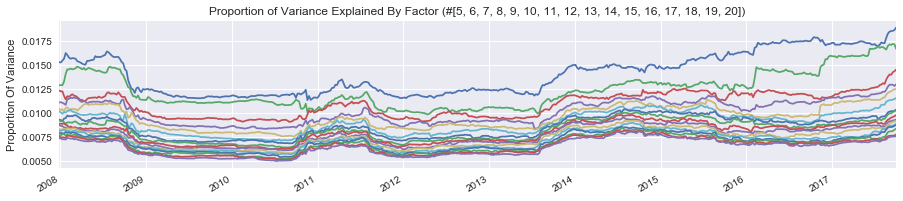

In [161]:
# set figure size
figureSize=(15,3)
# set factor number
factorNumber=[5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
# set cumulative flag
cumulativeFlag=False
# set legend flag
legendFlag=False
# plot proportion of variance by date
plotProportionOfVarianceByDate(proportionOfVariancePanel,factorNumber,cumulativeFlag,
    figureSize,legendFlag)

Rises in the importance of the fifth and sixth statistical factors beginning in mid-2013 – combination with the decline in the importance of the first factor and rise in the importance of the second, third, and fourth factors – signal a broad-based return of diversity to the instrument universe under study.


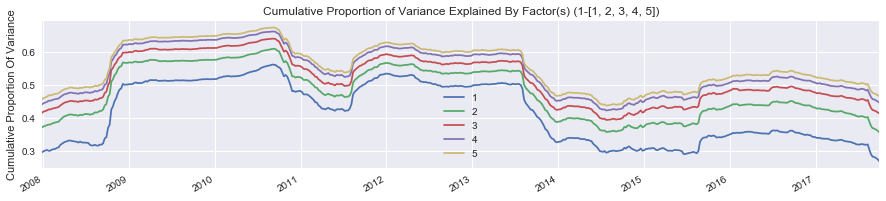

In [162]:
# set figure size
figureSize=(15,3)
# set factor number
factorNumber=[1,2,3,4,5]
# set cumulative flag
cumulativeFlag=True
# set legend flag
legendFlag=True
# plot proportion of variance by date
plotProportionOfVarianceByDate(proportionOfVariancePanel,factorNumber,cumulativeFlag,
    figureSize,legendFlag)

Focusing on the cumulative proportion of variance explained by the first five statistical factors, we observe return to pre-crisis levels of diversity.

The participation ratio - defined in the previous section - provides a sense of the number of stocks in our instrument universe that contribute to the statistical factor.

#### Evolution of the Participation Ratio of the First Factor Over Time

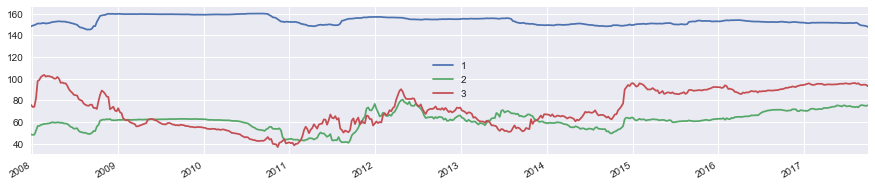

In [163]:
participationRatioByDate=participationRatioByDatePanel['participationRatio'].T
# set factor numbers
factorNumber=[1,2,3]
# set figure size
figureSize=(15,3)
participationRatioByDate[factorNumber].plot(figsize=figureSize)


The first factor represents the co-movement across almost all stocks and it is typically interpreted as the 'market mode'. We can see that while nearly all stocks contribute to the first factor in all weeks, the participation in the third statistical factor falls sharply between the end of 2008 and 2011. In combination with the time evolution of the proportion of variance of the first five factors, we can see that co-movement across stocks increased significantly in the period after the crisis, beginning in September 2008. The heighted importance of the factor representing co-movement across all stocks has only recently begun to decline to pre-crisis levels.

The following heatmap illustrates the behavior of the participation ratios of all factors.

#### Evolution of the Participation Ratio of all Factors Over Time


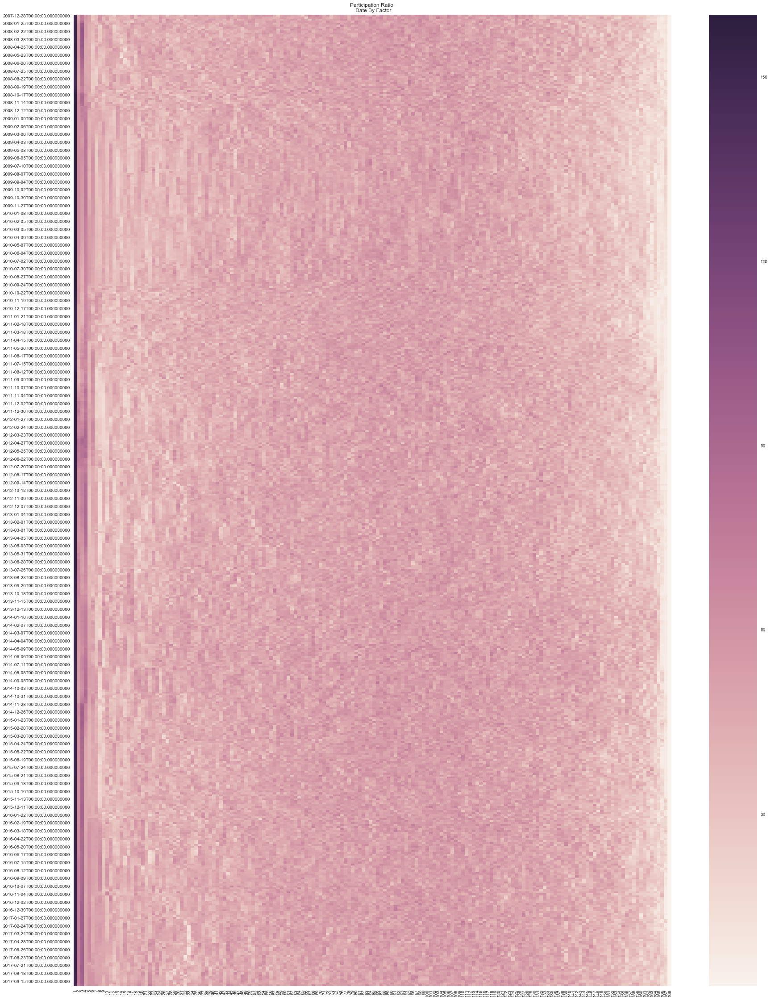

In [164]:
figureSize=(30,40)
plt.figure(figsize=figureSize)
plt.title('Participation Ratio \n Date By Factor')
ax = seaborn.heatmap(participationRatioByDate, 
    annot=False, yticklabels=4)

### Visualizing Properties of Single Stock Returns: Minimal Spanning Trees Constructed From Return Correlation Networks

In section III we outlined the construction of return-based correlation networks and their associated minimal spanning trees. In the following sub-section we examine visualizations of the Minimal Spanning Trees before and after performing a noise-reducing operation. We focus on the first and last dates of our sample in addition to the Friday following the bankruptcy filing of Lehman Brothers and yearly snapshots anchored to that key date.

In [165]:
# set filter flag
filterFlag=False

# define datetime
dateTime_20071228=datetime.datetime(2007,12,28)
# define datetime
dateTime_20080919=datetime.datetime(2008,9,19)
# define datetime
dateTime_20090918=datetime.datetime(2009,9,18)
# define datetime
dateTime_20100917=datetime.datetime(2010,9,17)
# define datetime
dateTime_20110916=datetime.datetime(2011,9,16)
# define datetime
dateTime_20120921=datetime.datetime(2012,9,21)
# define datetime
dateTime_20130920=datetime.datetime(2013,9,20)
# define datetime
dateTime_20140919=datetime.datetime(2014,9,19)
# define datetime
dateTime_20150918=datetime.datetime(2015,9,18)
# define datetime
dateTime_20160916=datetime.datetime(2016,9,16)
# define datetime
dateTime_20170929=datetime.datetime(2017,9,29)

# build correlation network
G_U_20071228=correlationNetwork_Gics(rollingCorrelation,dateTime_20071228,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20080919=correlationNetwork_Gics(rollingCorrelation,dateTime_20080919,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20090918=correlationNetwork_Gics(rollingCorrelation,dateTime_20090918,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20100917=correlationNetwork_Gics(rollingCorrelation,dateTime_20100917,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20110916=correlationNetwork_Gics(rollingCorrelation,dateTime_20110916,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20120921=correlationNetwork_Gics(rollingCorrelation,dateTime_20120921,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20130920=correlationNetwork_Gics(rollingCorrelation,dateTime_20130920,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20140919=correlationNetwork_Gics(rollingCorrelation,dateTime_20140919,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20150918=correlationNetwork_Gics(rollingCorrelation,dateTime_20150918,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20160916=correlationNetwork_Gics(rollingCorrelation,dateTime_20160916,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation network
G_U_20170929=correlationNetwork_Gics(rollingCorrelation,dateTime_20170929,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)


In [166]:
# set filter flag
filterFlag=True

# build correlation matrix (filtered)
G_F_20071228=correlationNetwork_Gics(rollingCorrelation,dateTime_20071228,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20080919=correlationNetwork_Gics(rollingCorrelation,dateTime_20080919,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20090918=correlationNetwork_Gics(rollingCorrelation,dateTime_20090918,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20100917=correlationNetwork_Gics(rollingCorrelation,dateTime_20100917,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20110916=correlationNetwork_Gics(rollingCorrelation,dateTime_20110916,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20120921=correlationNetwork_Gics(rollingCorrelation,dateTime_20120921,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20130920=correlationNetwork_Gics(rollingCorrelation,dateTime_20130920,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20140919=correlationNetwork_Gics(rollingCorrelation,dateTime_20140919,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20150918=correlationNetwork_Gics(rollingCorrelation,dateTime_20150918,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20160916=correlationNetwork_Gics(rollingCorrelation,dateTime_20160916,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)
# build correlation matrix (filtered)
G_F_20170929=correlationNetwork_Gics(rollingCorrelation,dateTime_20170929,
    instrumentTickers,sector2Color,ticker2Sector,lookback,filterFlag)


In [167]:
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20071228=minimalSpanningTree_Gics(G_U_20071228,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20080919=minimalSpanningTree_Gics(G_U_20080919,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20090918=minimalSpanningTree_Gics(G_U_20090918,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20100917=minimalSpanningTree_Gics(G_U_20100917,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20110916=minimalSpanningTree_Gics(G_U_20110916,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20120921=minimalSpanningTree_Gics(G_U_20120921,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20130920=minimalSpanningTree_Gics(G_U_20130920,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20140919=minimalSpanningTree_Gics(G_U_20140919,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20150918=minimalSpanningTree_Gics(G_U_20150918,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20160916=minimalSpanningTree_Gics(G_U_20160916,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (unfiltered) 
tree_graph_U_20170929=minimalSpanningTree_Gics(G_U_20170929,instrumentTickers,
    sector2Color,ticker2Sector)


#### Minimal Spanning Tree of Unfiltered Correlation Network (2007-12-28)

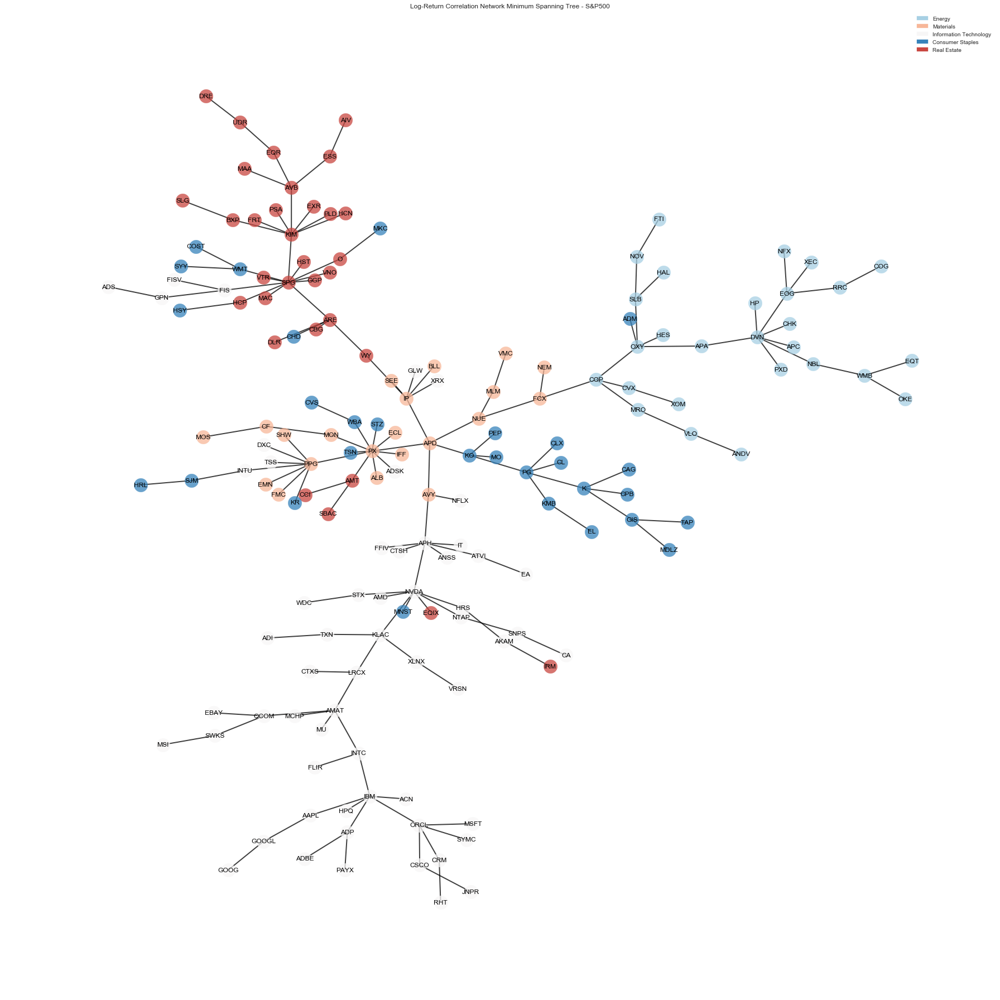

In [168]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20071228,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of Unfiltered Correlation Network (2008-09-19)

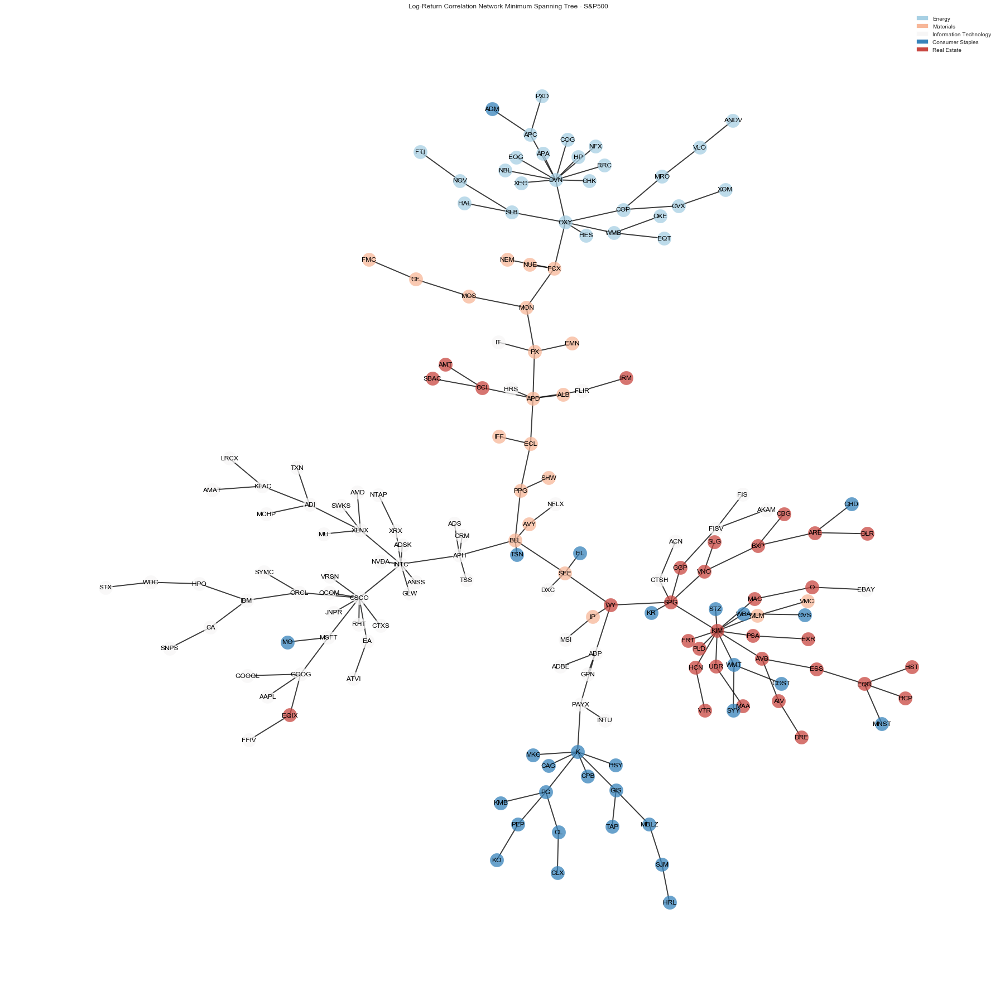

In [169]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20080919,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of Unfiltered Correlation Network (2009-09-18)

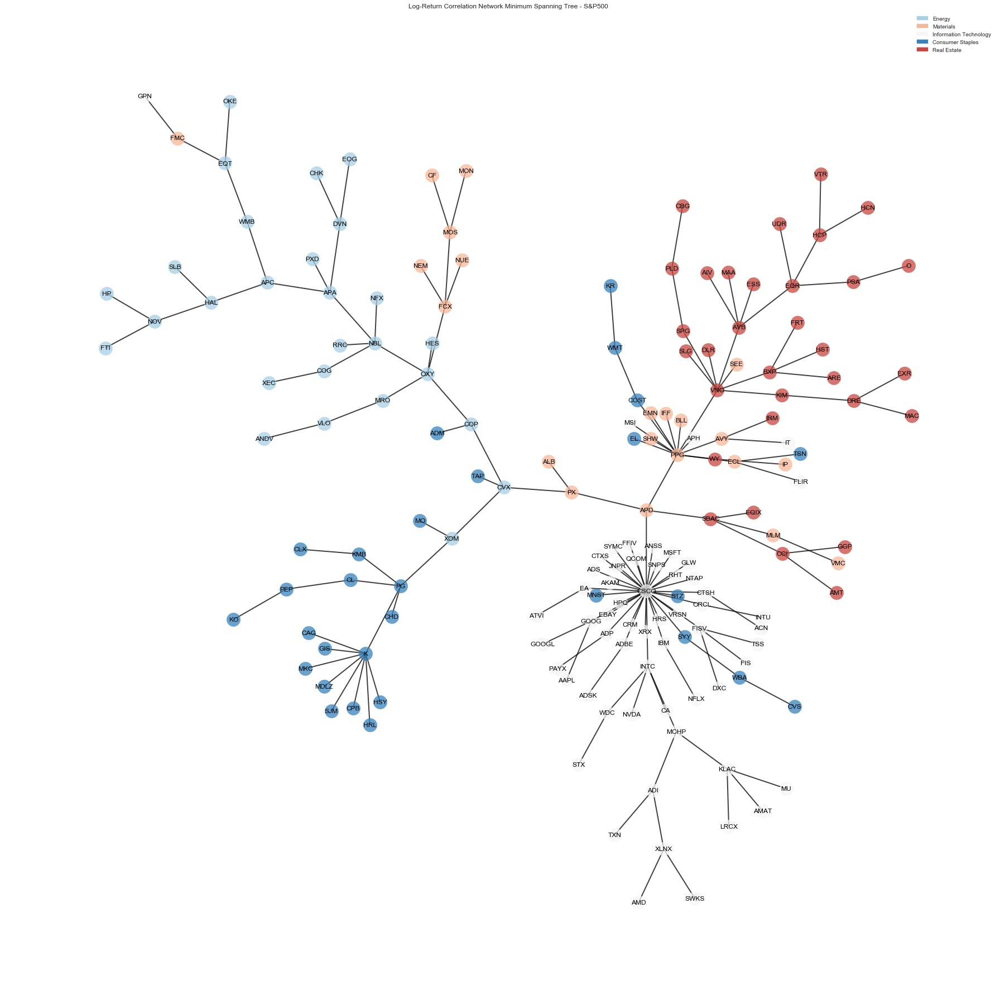

In [170]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20090918,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2010-09-17)

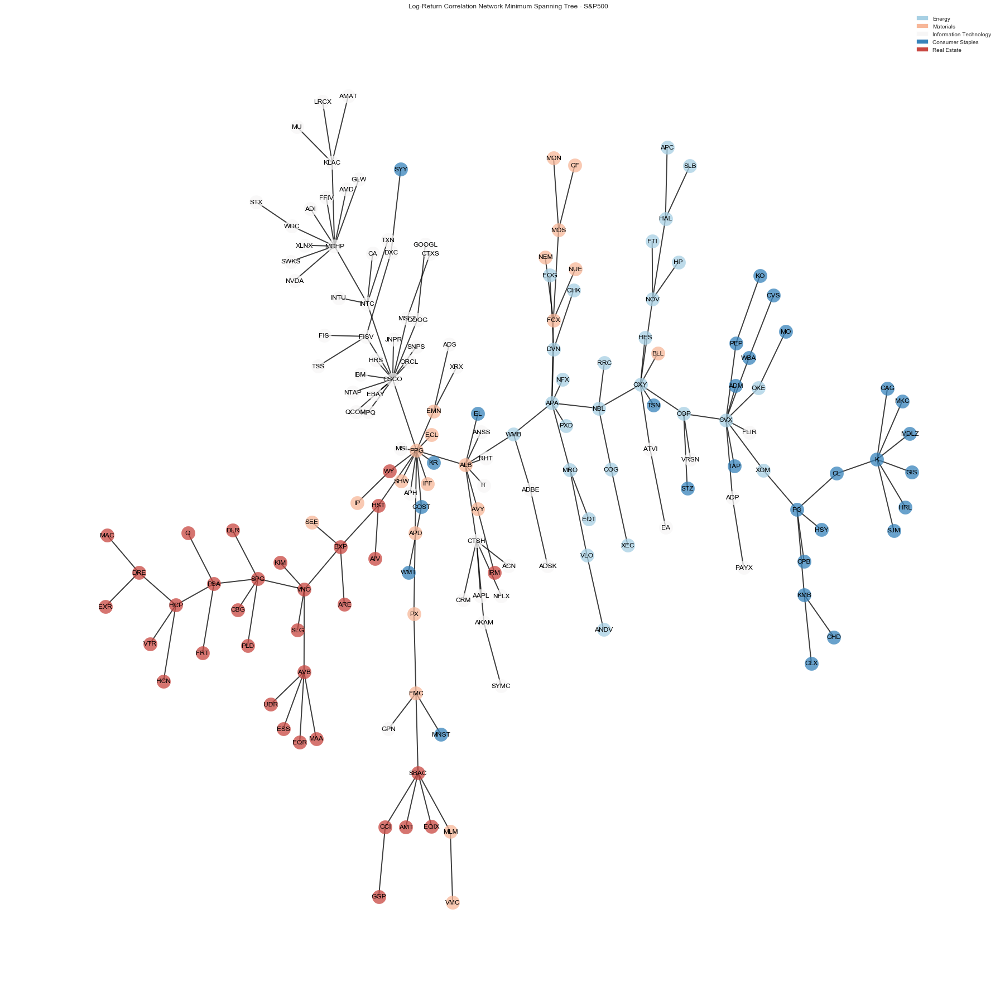

In [171]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20100917,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2011-09-16)

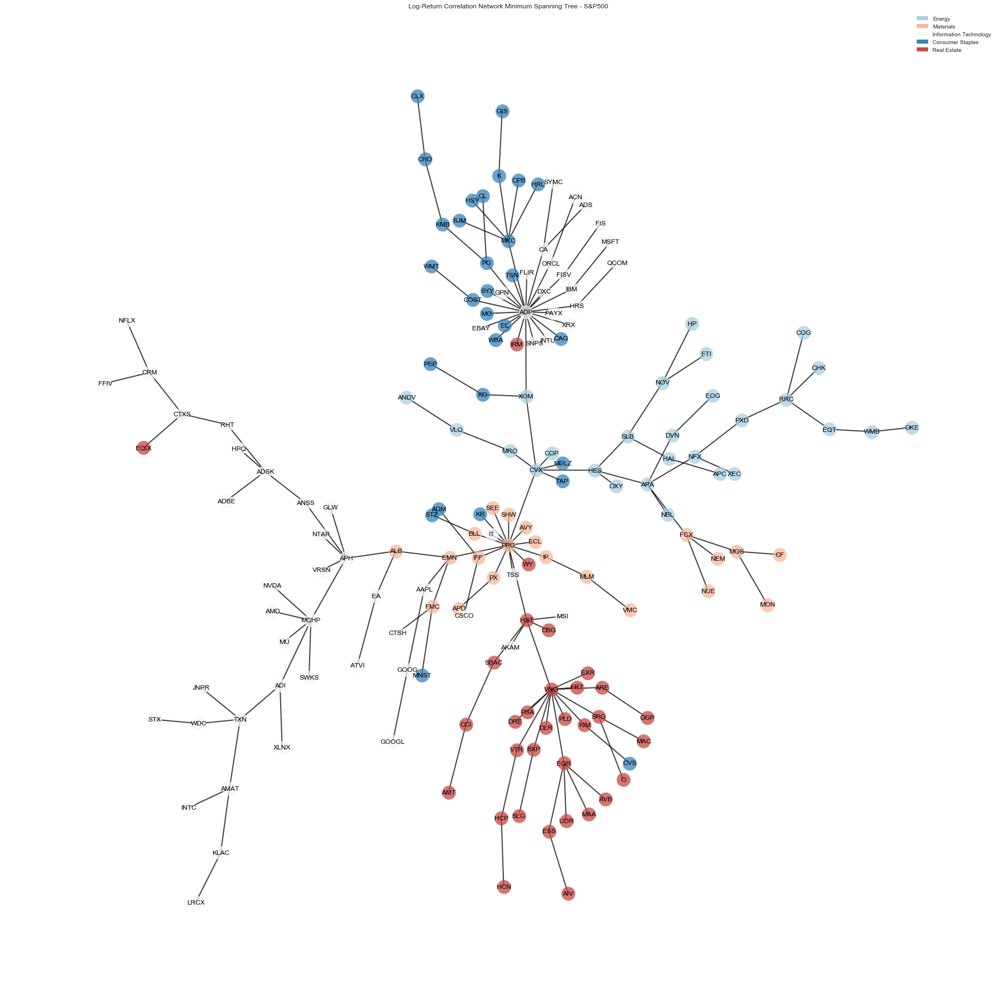

In [172]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20110916,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2012-09-21)

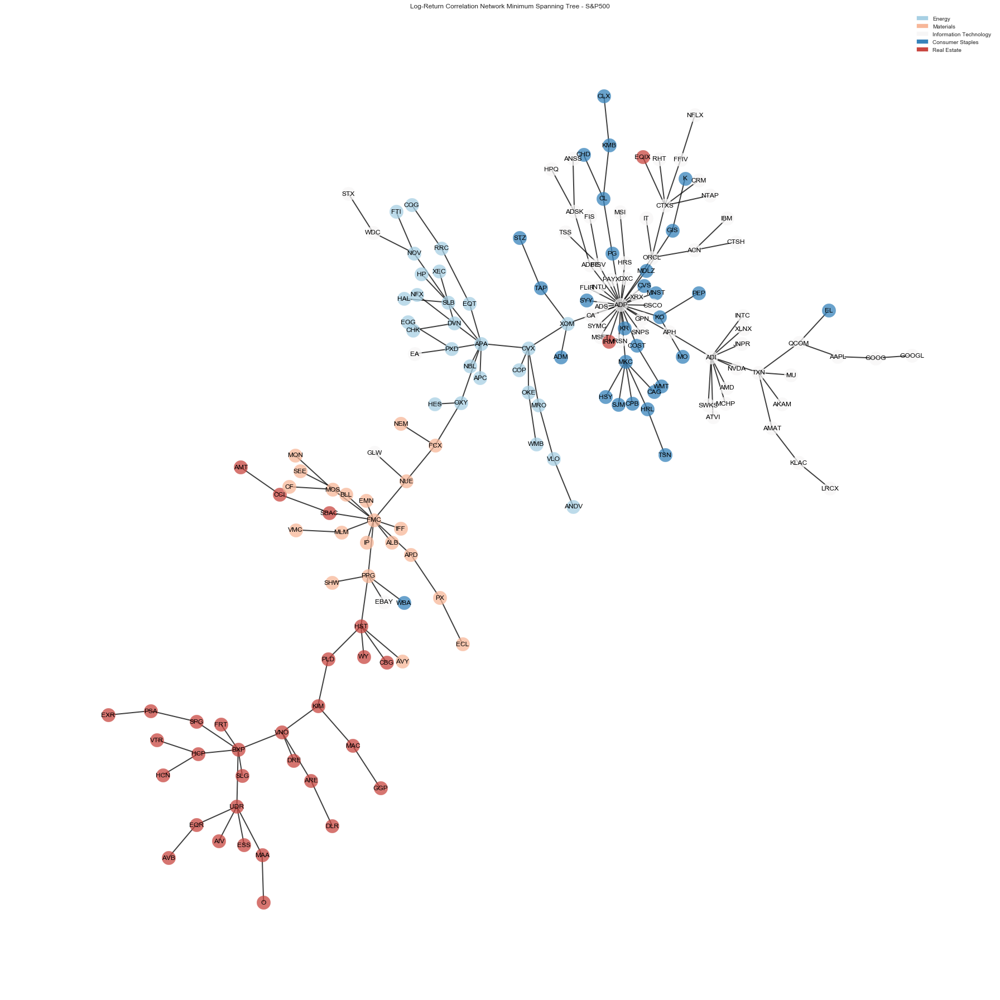

In [173]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20120921,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2013-09-20)

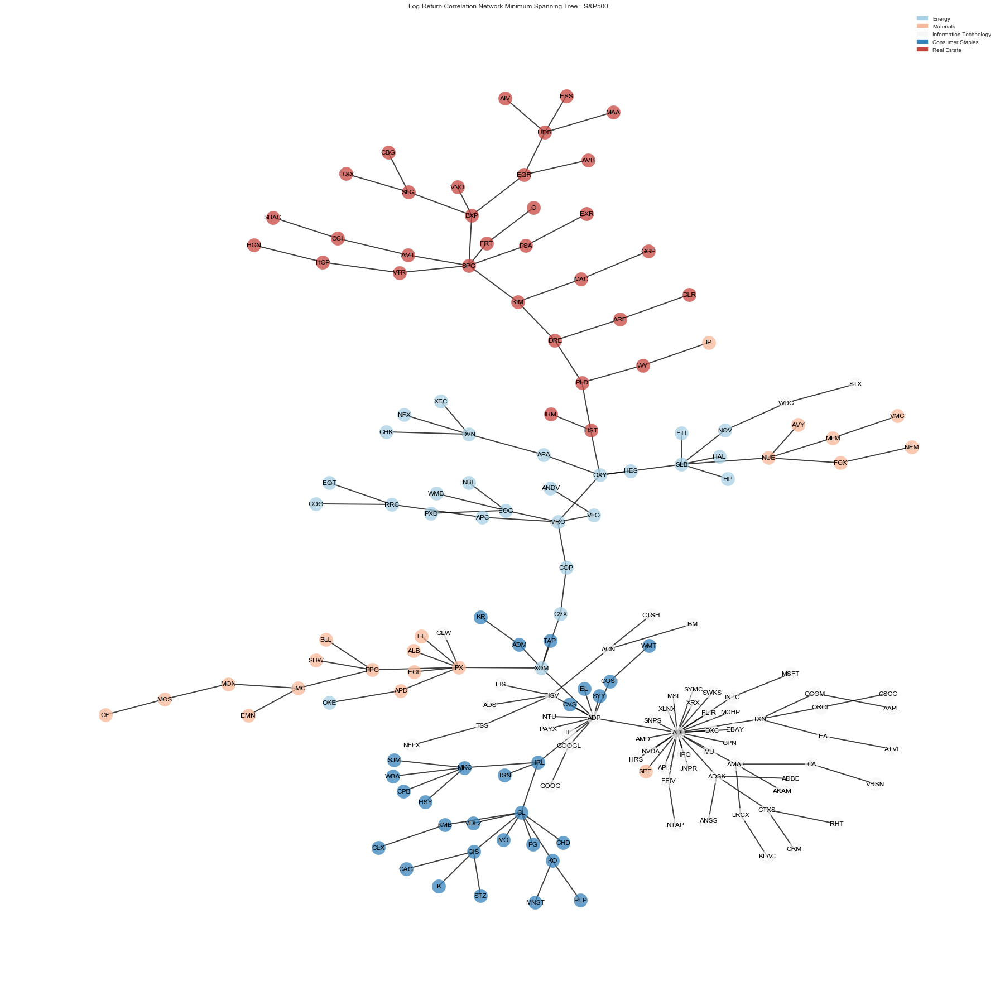

In [174]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20130920,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2014-09-19)

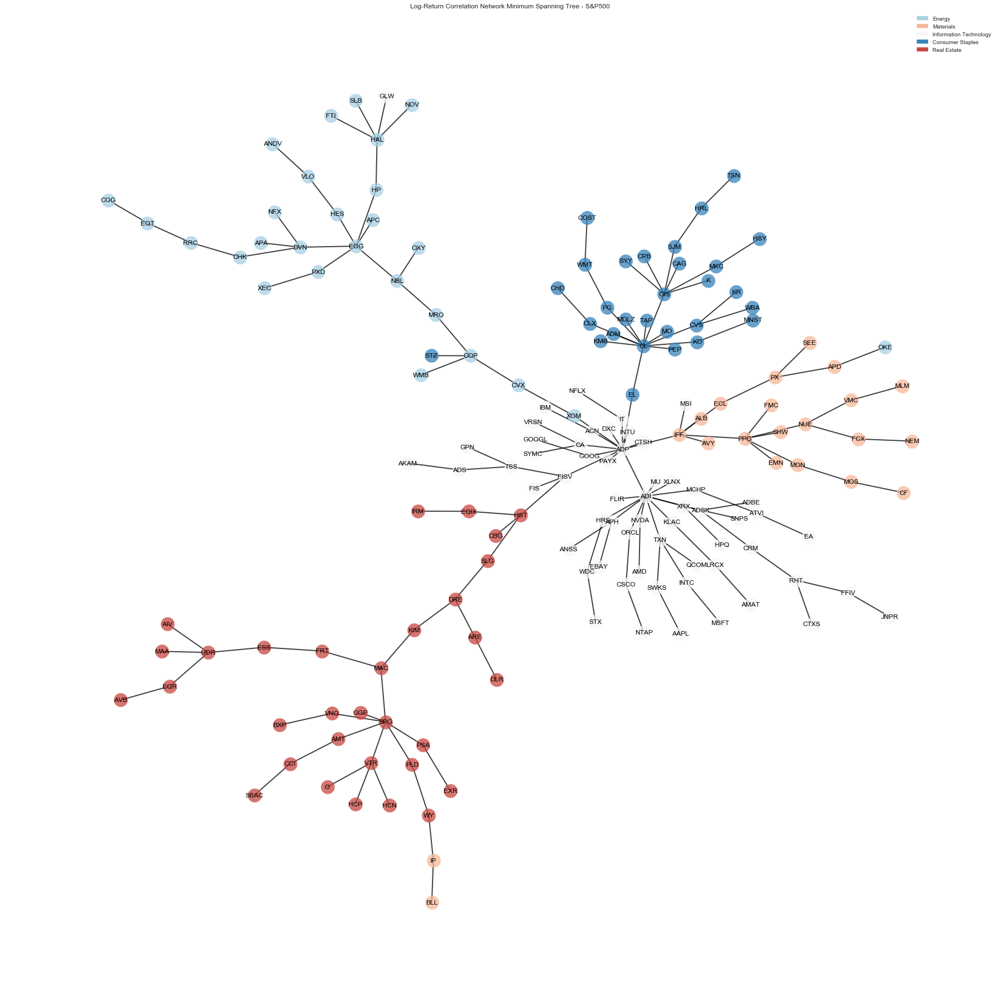

In [175]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20140919,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2015-09-18)

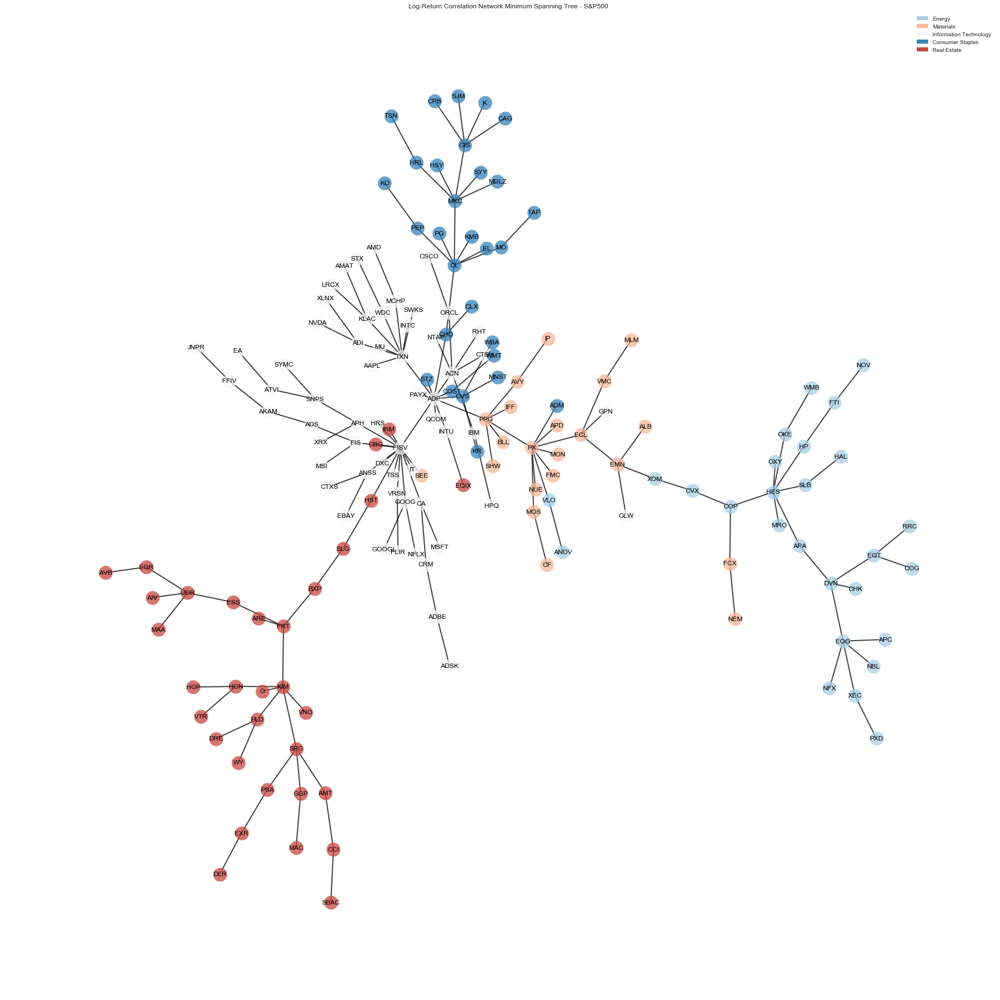

In [176]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20150918,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2016-09-16)

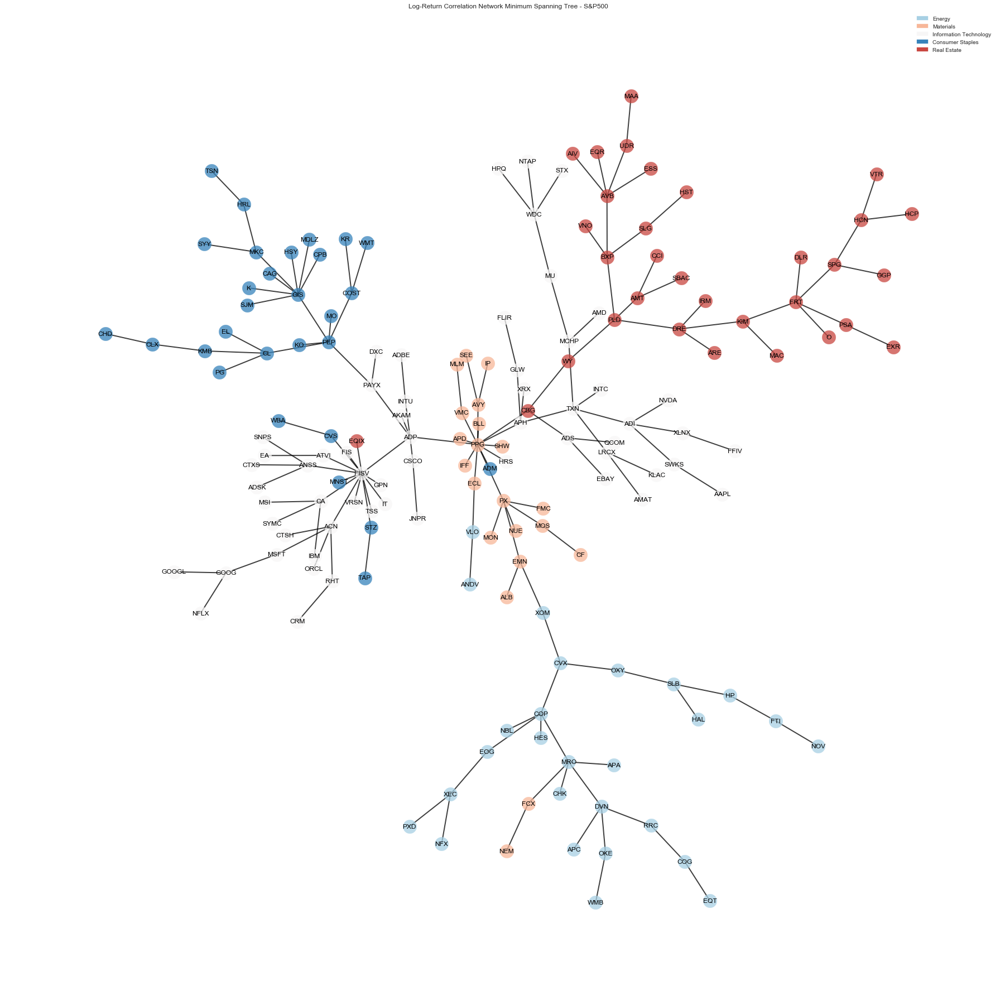

In [177]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20160916,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of Unfiltered Correlation Network (2017-09-29)

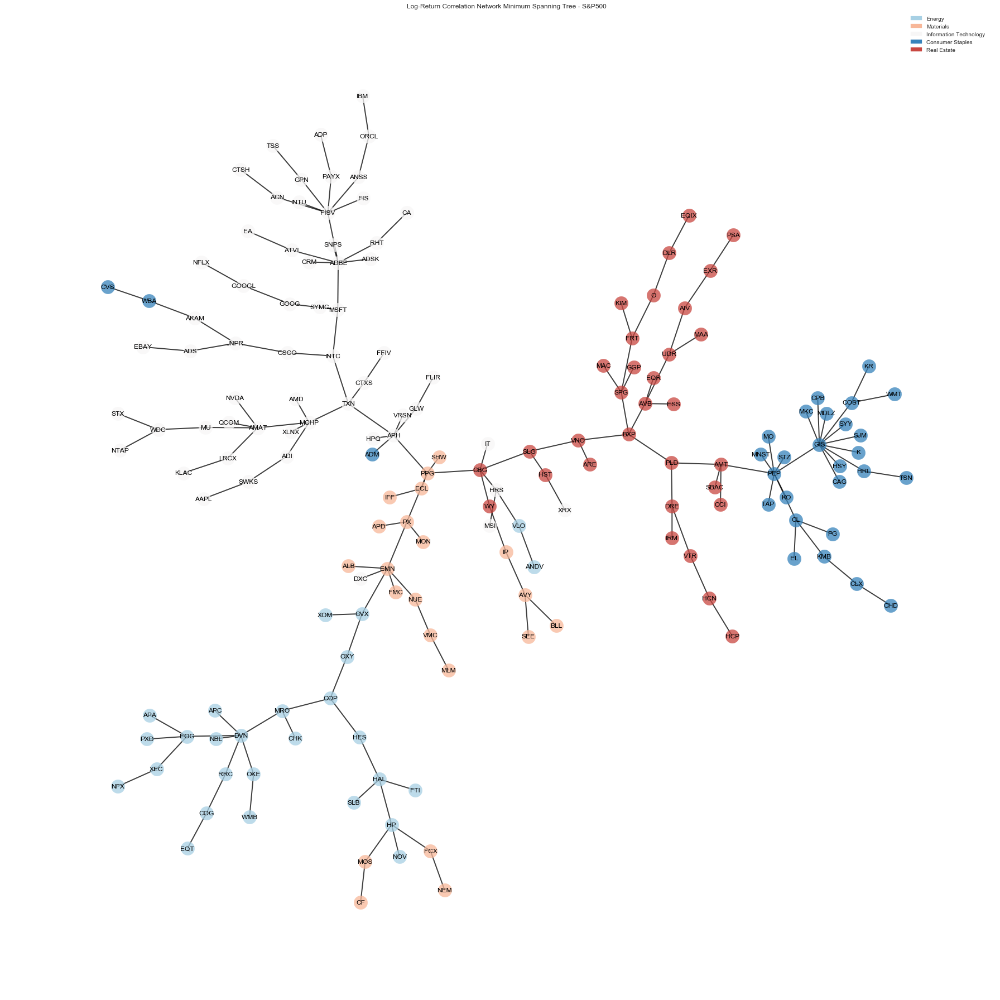

In [178]:
# define figure size
figureSize=(25,25)
# define instrument universe name
instrumentUniverseName='S&P500'
# plot minimal spanning tree (unfiltered) 
plotMinimalSpanningTree_Gics(tree_graph_U_20170929,instrumentUniverseName,
    sector2Color,figureSize)


In [179]:
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20071228=minimalSpanningTree_Gics(G_F_20071228,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20080919=minimalSpanningTree_Gics(G_F_20080919,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20090918=minimalSpanningTree_Gics(G_F_20090918,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20100917=minimalSpanningTree_Gics(G_F_20100917,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20110916=minimalSpanningTree_Gics(G_F_20110916,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20120921=minimalSpanningTree_Gics(G_F_20120921,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20130920=minimalSpanningTree_Gics(G_F_20130920,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20140919=minimalSpanningTree_Gics(G_F_20140919,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20150918=minimalSpanningTree_Gics(G_F_20150918,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20160916=minimalSpanningTree_Gics(G_F_20160916,instrumentTickers,
    sector2Color,ticker2Sector)
# build minimal spanning tree (MST) (filtered) 
tree_graph_F_20170929=minimalSpanningTree_Gics(G_F_20170929,instrumentTickers,
    sector2Color,ticker2Sector)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2007-12-28)

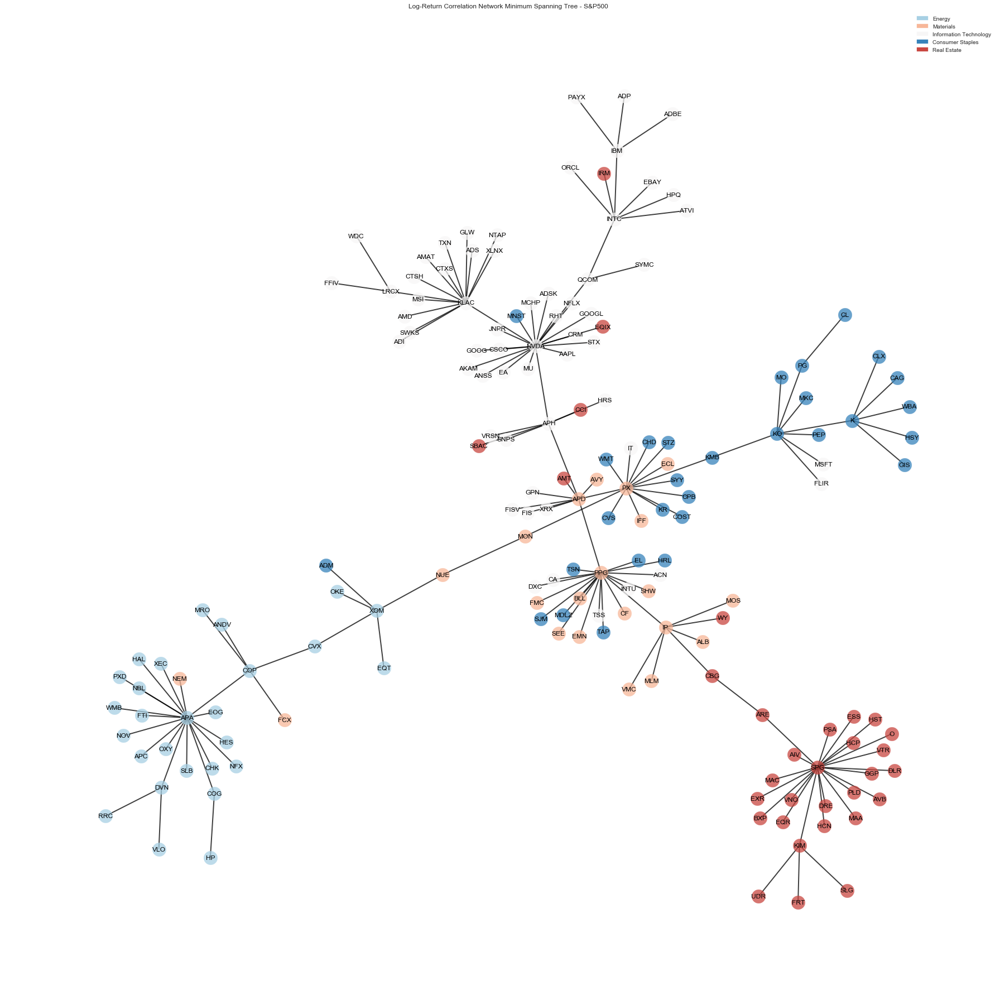

In [180]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20071228,instrumentUniverseName,
    sector2Color,figureSize)


At the end of the week when Lehman Brothers filed for bankrupcy...

#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2008-09-19)

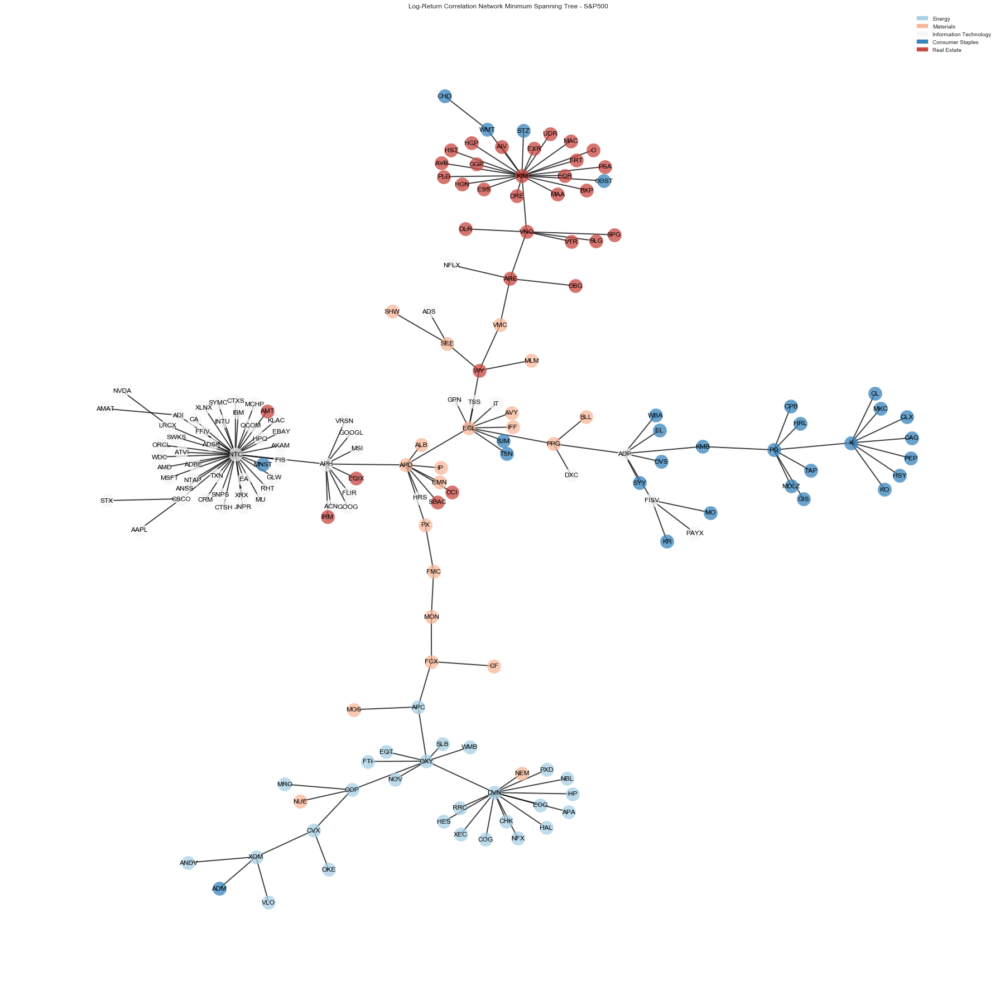

In [181]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20080919,instrumentUniverseName,
    sector2Color,figureSize)


Roughly a year after the bankruptcy filing of Lehman Brothers...

#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2009-09-18)

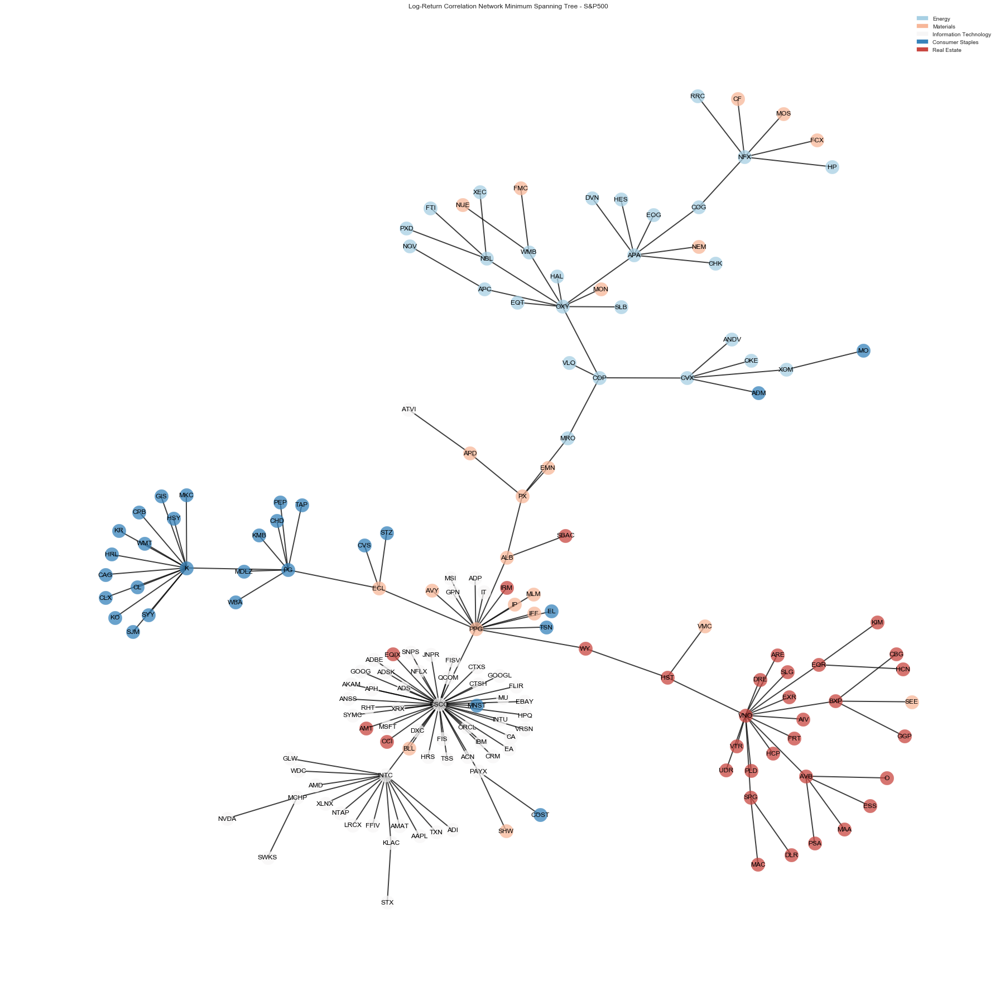

In [182]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20090918,instrumentUniverseName,
    sector2Color,figureSize)

#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2010-09-17)

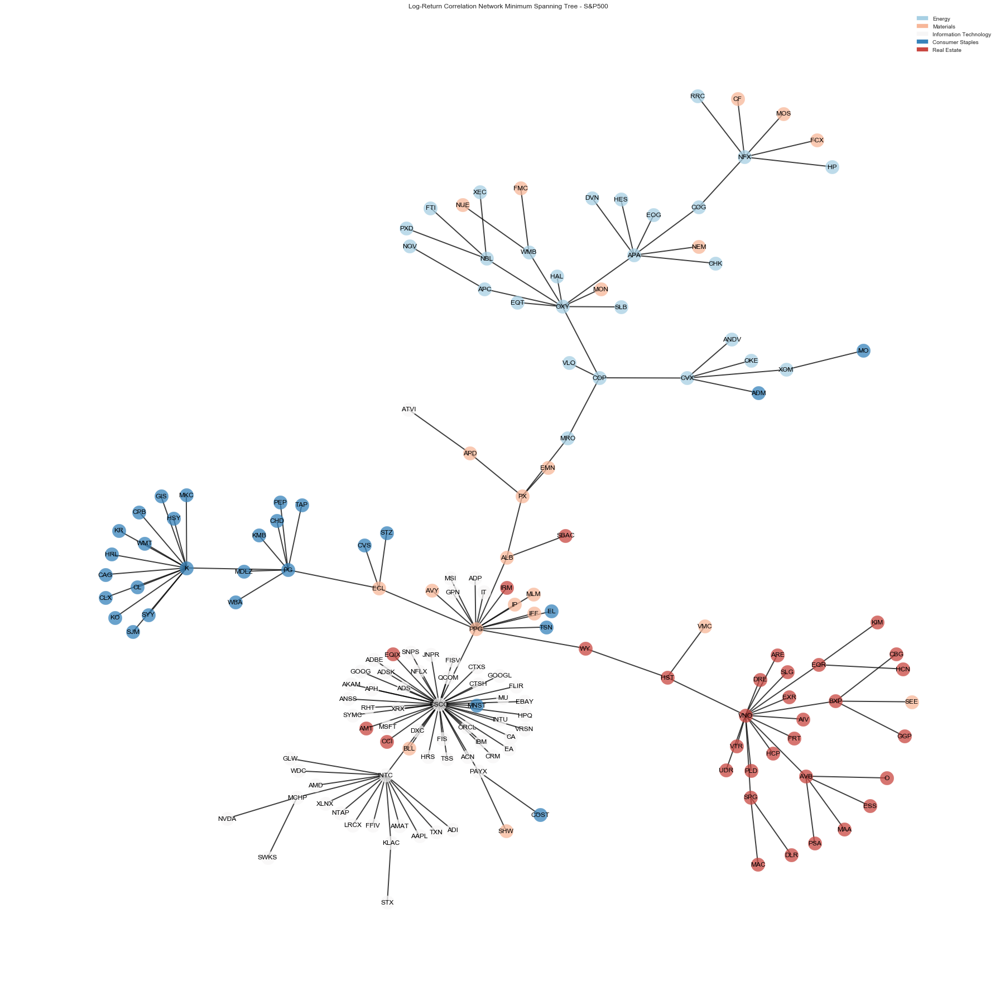

In [183]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20090918,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2011-09-16)

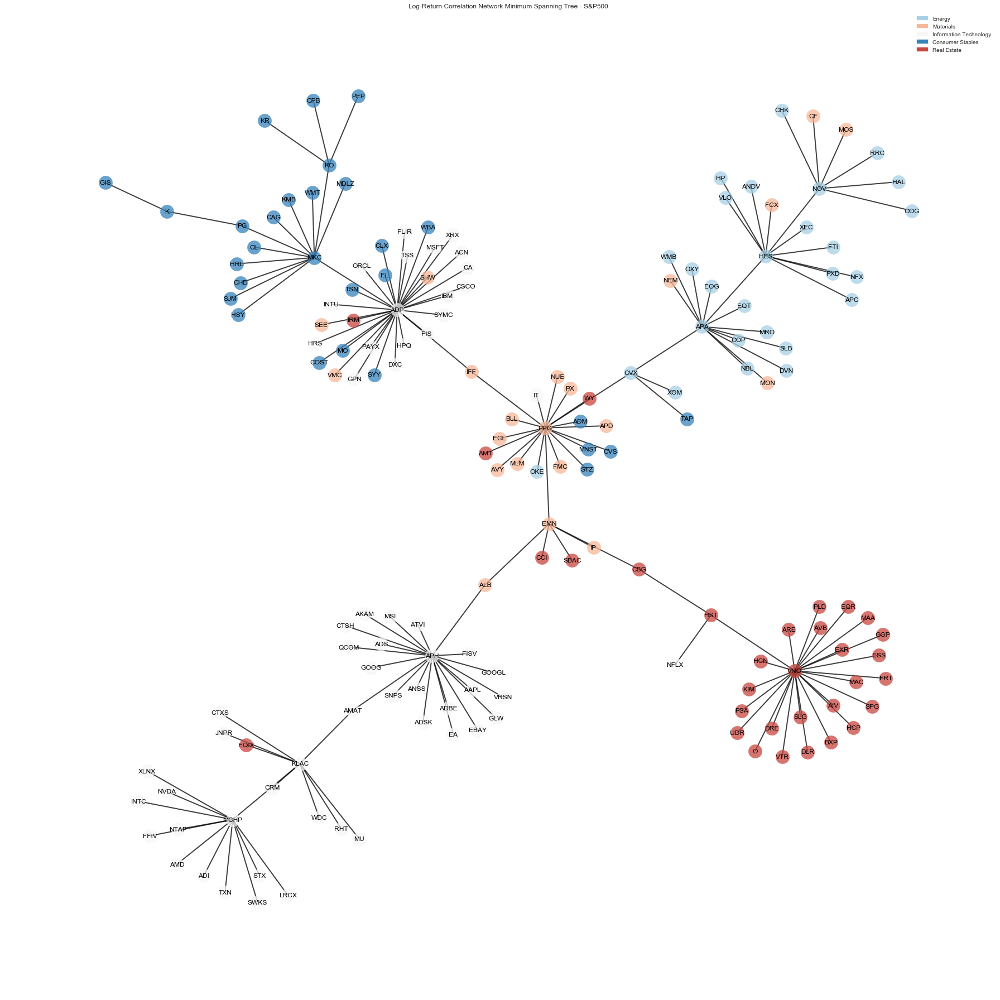

In [184]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20110916,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2012-09-21)

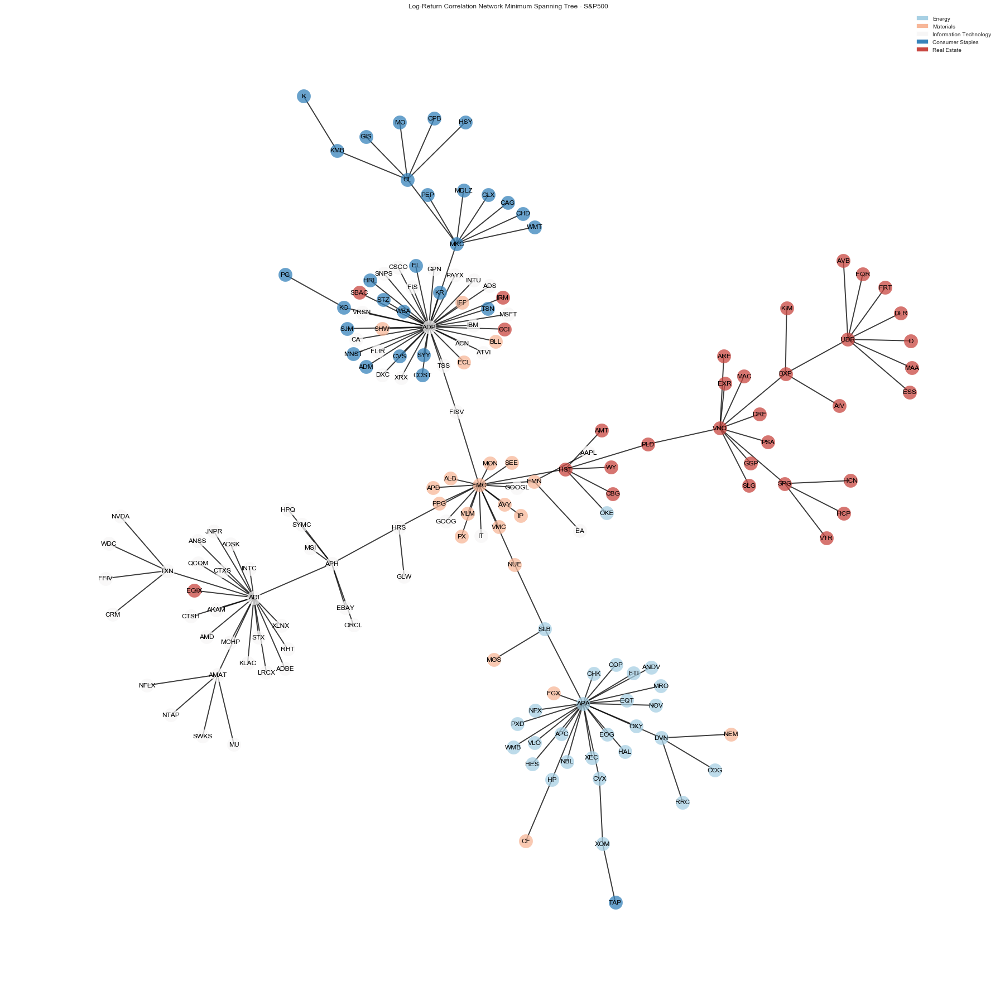

In [185]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20120921,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2013-09-20)

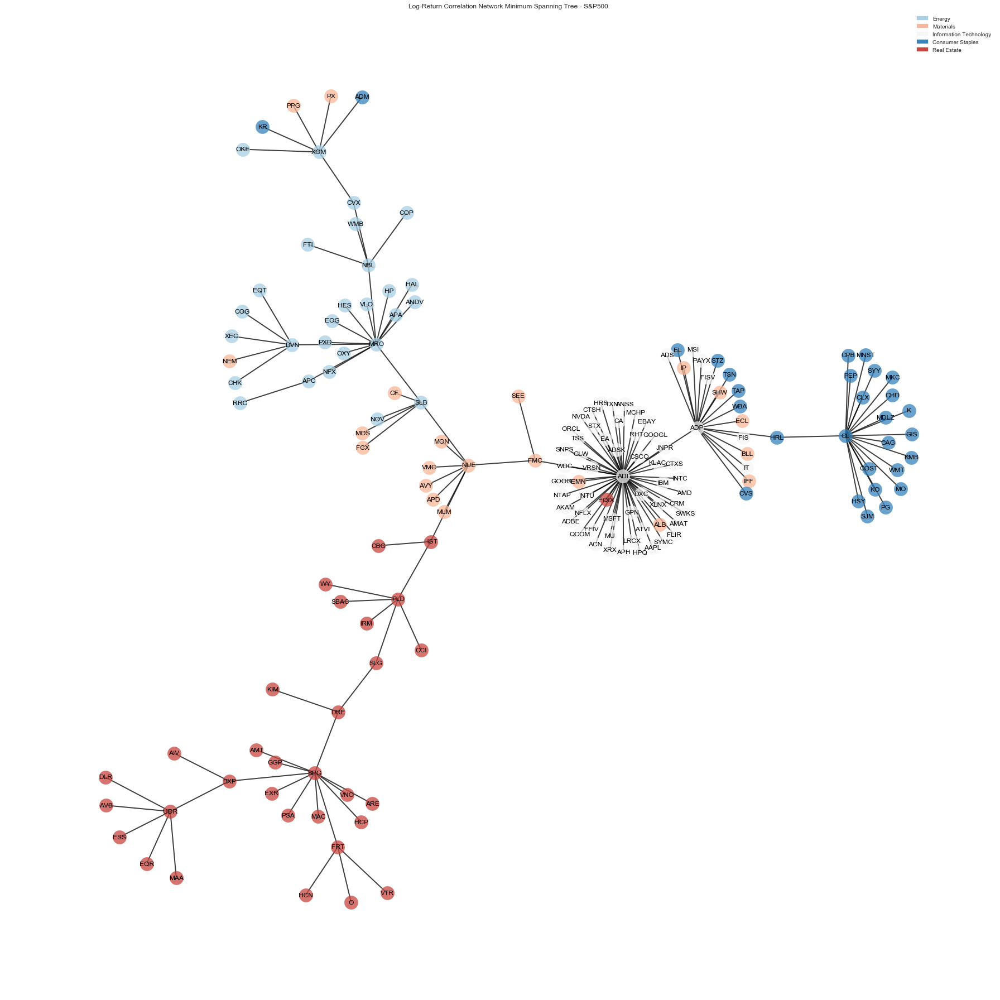

In [186]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20130920,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2014-09-19)

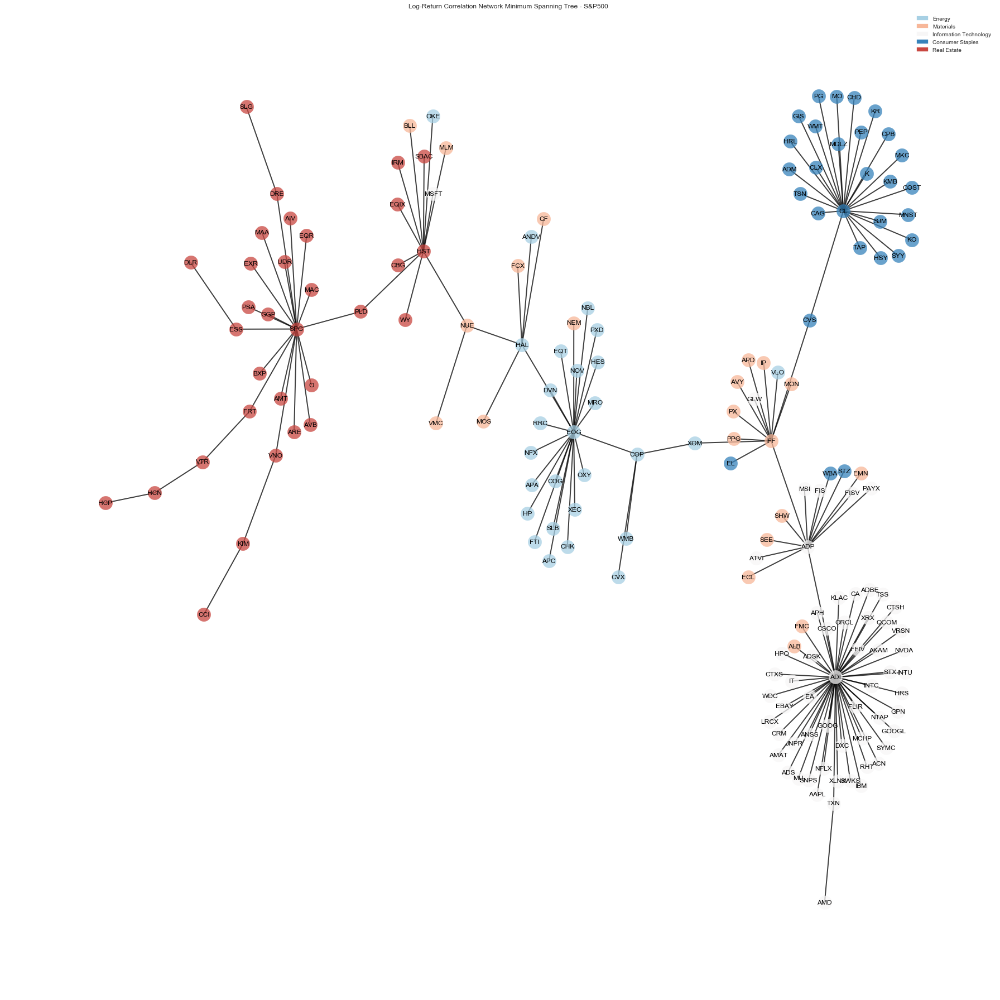

In [187]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20140919,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2015-09-18)

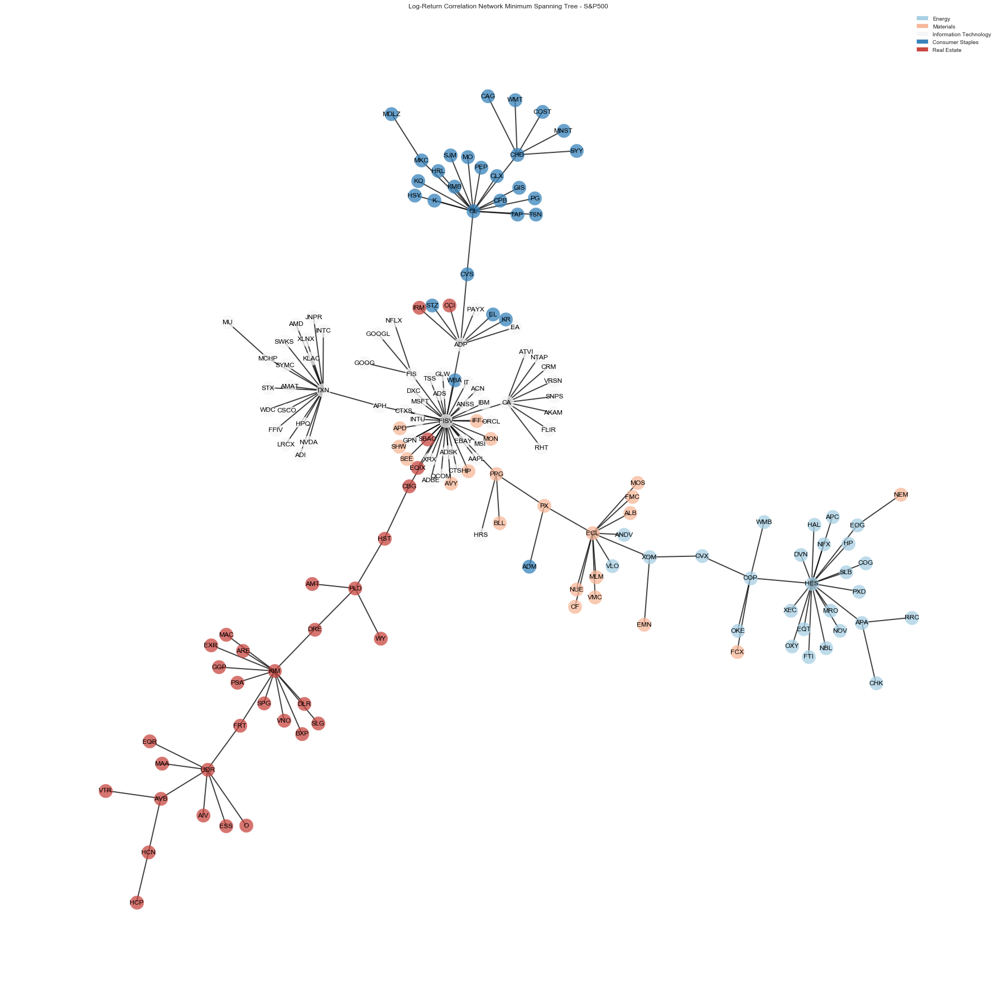

In [188]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20150918,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2016-09-16)

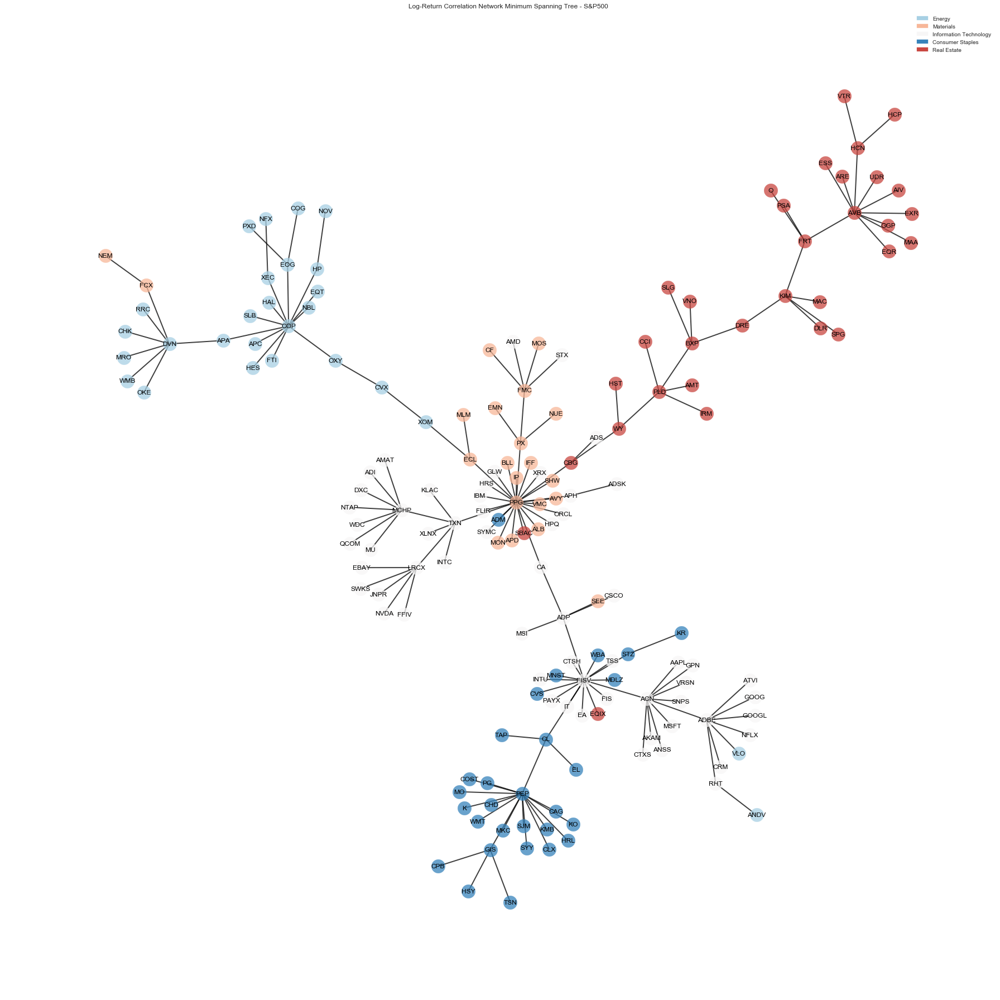

In [189]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20160916,instrumentUniverseName,
    sector2Color,figureSize)


#### Minimal Spanning Tree of RMT-Based Filtered Correlation Network (2017-09-29)

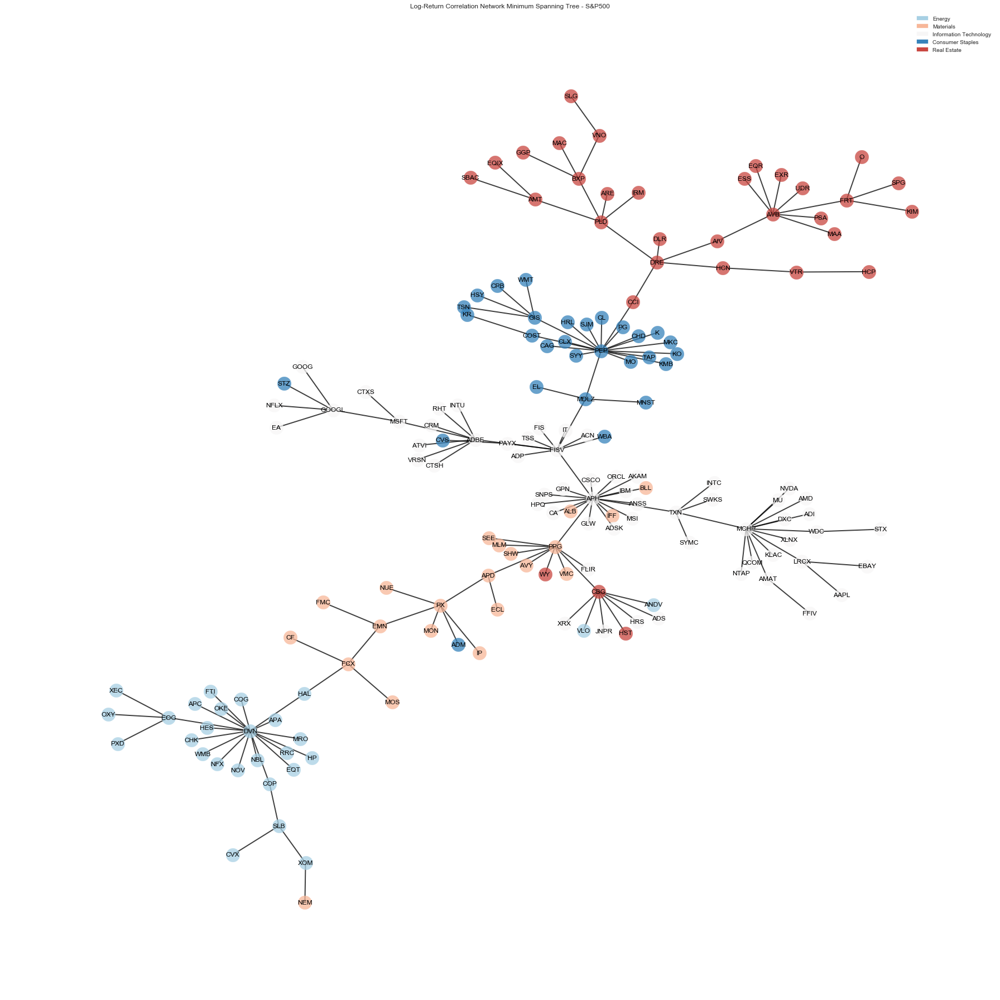

In [190]:
# define figure size
figureSize=(25,25)
# plot minimal spanning tree (filtered) 
plotMinimalSpanningTree_Gics(tree_graph_F_20170929,instrumentUniverseName,
    sector2Color,figureSize)


Although the extent to which these networks organize around sectors varies over time, distinct clusters by sector are clearly visible in many periods. There is also a noticeable difference in the appearance of the unfiltered and filtered graphs, with the later graphs tending to possess more star-shaped clusters. In general, the unfiltered graphs show a misleading level of diversification.

In the next section we focus on the development of simple metrics that can summarize the market state with respect to the level of diversification based on the relationships that emerge from the formation of the Minimal Spanning Tree for each period.


### Topological Properties Derived from the Minimal Spanning Tree Representation of the Correlation Network



In [191]:

if (computeUnfilteredMST):

    # start timer (compute rolling correlation)
    ts_computeRollingUnfilteredMST = timer()   
    
    # do topological analysis by date (unfiltered)
    resultsByDate_U=topologicalAnalysisByDateWeekly_U(rollingCorrelation,subsetInstrumentMaster,
        sector2Color,ticker2Sector,lookback)

    # extract 'by-date' results
    #graphsByDate_U=resultsByDate_U['graphsByDate']
    degreeByInstrumentByDate_U=resultsByDate_U['degreeByInstrumentByDate_U']
    degreeByInstrumentByDateMST_U=resultsByDate_U['degreeByInstrumentByDateMST_U']

    # convert degree by instrument by date dictionary to panel (unfiltered)
    degreeByInstrumentByDatePanel_U=pandas.Panel.from_dict(degreeByInstrumentByDate_U,
    orient='minor')
    # convert MST degree by instrument by date dictionary to panel (unfiltered)
    degreeByInstrumentByDatePanelMST_U=pandas.Panel.from_dict(degreeByInstrumentByDateMST_U,
        orient='minor')

    # create the HDF5 data store for degree by instrument by date
    degreeByInstrumentByDatePanel_U.to_hdf(outputDirectory+'degreeByInstrumentByDate_U_subset.h5',
        'degreeByInstrumentByDatePanel_U')
    # create the HDF5 data store for MST degree by instrument by date
    degreeByInstrumentByDatePanelMST_U.to_hdf(outputDirectory+'degreeByInstrumentByDateMST_U_subset.h5',
        'degreeByInstrumentByDatePanelMST_U')

    # end timer (compute rolling correlation)
    te_computeRollingUnfilteredMST = timer()
    
    # compute time elasped
    timeElasped_computeRollingUnfilteredMST=te_computeRollingUnfilteredMST-ts_computeRollingUnfilteredMST
    
    # display time elasped
    print('Time Elasped: '+str(timeElasped_computeRollingUnfilteredMST))    

else:
    # read proportion of variance by date panel from the HDF5 results store
    degreeByInstrumentByDatePanel_U = pandas.read_hdf(outputDirectory+'degreeByInstrumentByDate_U_subset.h5',
        'degreeByInstrumentByDatePanel_U')
    # read participation ratio by date panel from the HDF5 results store
    degreeByInstrumentByDatePanelMST_U = pandas.read_hdf(outputDirectory+'degreeByInstrumentByDateMST_U_subset.h5',
        'degreeByInstrumentByDatePanelMST_U') 


In [192]:
degreeByInstrumentByDateMST_U=degreeByInstrumentByDatePanelMST_U['degree'].T

Move this section and sort; use dates of graphs???

In [193]:
#degreeByInstrumentByDateMST_U.loc['2017-09-29'].plot('bar',figsize=(30,3))

In [194]:

if (computeFilteredMST):

    # start timer (compute rolling correlation)
    ts_computeRollingFilteredMST = timer()   


    # do topological analysis by date (filtered)
    resultsByDate_F=topologicalAnalysisByDateWeekly_F(rollingCorrelation,instrumentMaster,
        sector2Color,ticker2Sector,lookback)

    # extract 'by-date' results
    #graphsByDate_F=resultsByDate_F['graphsByDate']
    degreeByInstrumentByDate_F=resultsByDate_F['degreeByInstrumentByDate_F']
    degreeByInstrumentByDateMST_F=resultsByDate_F['degreeByInstrumentByDateMST_F']

    # convert degree by instrument by date dictionary to panel (filtered)
    degreeByInstrumentByDatePanel_F=pandas.Panel.from_dict(degreeByInstrumentByDate_F,
        orient='minor')
    # convert MST degree by instrument by date dictionary to panel (filtered)
    degreeByInstrumentByDatePanelMST_F=pandas.Panel.from_dict(degreeByInstrumentByDateMST_F,
        orient='minor')

    # create the HDF5 data store for rolling correlations (centered)
    degreeByInstrumentByDatePanel_F.to_hdf(outputDirectory+'degreeByInstrumentByDate_F_subset.h5',
        'degreeByInstrumentByDatePanel_F')
    # create the HDF5 data store for rolling correlations (centered)
    degreeByInstrumentByDatePanelMST_F.to_hdf(outputDirectory+'degreeByInstrumentByDateMST_F_subset.h5',
        'degreeByInstrumentByDatePanelMST_F')

    # end timer (compute rolling correlation)
    te_computeRollingFilteredMST = timer()
    
    # compute time elasped
    timeElasped_computeRollingFilteredMST=te_computeRollingFilteredMST-ts_computeRollingFilteredMST
    
    # display time elasped
    print('Time Elasped: '+str(timeElasped_computeRollingFilteredMST))

else:
    # read proportion of variance by date panel from the HDF5 results store
    degreeByInstrumentByDatePanel_F = pandas.read_hdf(outputDirectory+'degreeByInstrumentByDate_F_subset.h5',
        'degreeByInstrumentByDatePanel_F')
    # read participation ratio by date panel from the HDF5 results store
    degreeByInstrumentByDatePanelMST_F = pandas.read_hdf(outputDirectory+'degreeByInstrumentByDateMST_F_subset.h5',
        'degreeByInstrumentByDatePanelMST_F')


In [195]:
# extract degree by instrument by date (MST - filtered)
degreeByInstrumentByDateMST_F=degreeByInstrumentByDatePanelMST_F['degree'].T
# extract degree by instrument by date (MST - unfiltered)
degreeByInstrumentByDateMST_U=degreeByInstrumentByDatePanelMST_U['degree'].T

In [196]:
def plotNumberOfStocksWithDegreeAboveThreshold(degreeByInstrumentByDateMST_F,degreeThreshold,figureSize):
    # for each stock and datetime determine whether degree is above threshold
    degreeAboveThresholdFlag=degreeByInstrumentByDateMST_F>degreeThreshold
    # count number of stocks with degree above threshold for each date
    nDegreeAboveThreshold=degreeAboveThresholdFlag.sum(axis=1)
    # plot number of stocks with degree above threhold
    nDegreeAboveThreshold.plot()
    
    return nDegreeAboveThreshold

def plotNumberOfStocksWithDegreeEqualToOrBelowThreshold(degreeByInstrumentByDateMST_F,degreeThreshold,figureSize):
    # for each stock and datetime determine whether degree is above threshold
    degreeEqualToOrBelowThresholdFlag=degreeByInstrumentByDateMST_F<=degreeThreshold
    # count number of stocks with degree above threshold for each date
    nDegreeEqualToOrBelowThreshold=degreeEqualToOrBelowThresholdFlag.sum(axis=1)
    # plot number of stocks with degree above threhold
    nDegreeEqualToOrBelowThreshold.plot()
    
    return nDegreeEqualToOrBelowThreshold


We compute the degree of the unfiltered and filtered Minimal Spanning Trees for each week and count the number of stocks with degrees above a threshold of one. We also count the number of stocks with degrees equal to one. The results are plotted below for both the filtered and unfiltered Minimal Spanning Trees derived from the rolling correlation matrices.

#### Minimal Spanning Tree from Unfiltered Correlation Network -  Evolution of Number Of Stocks With Degree Above Threshold  Over Time

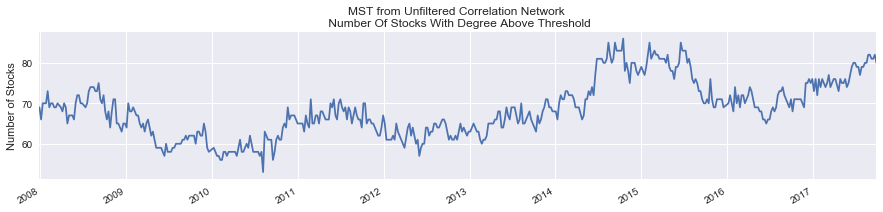

In [197]:
# define figure size
figureSize=(15,3)
plt.figure(figsize=figureSize)
# set degree threshold
degreeThreshold=1
# plot number of stocks with degree above threshold
nDegreeAboveThreshold=plotNumberOfStocksWithDegreeAboveThreshold(
    degreeByInstrumentByDateMST_U,degreeThreshold,figureSize)
plt.title('MST from Unfiltered Correlation Network \n Number Of Stocks With Degree Above Threshold')
plt.ylabel('Number of Stocks')

#### Minimal Spanning Tree from Unfiltered Correlation Network -  Evolution of Number Of Stocks With Degree Equal to or Below Threshold  Over Time

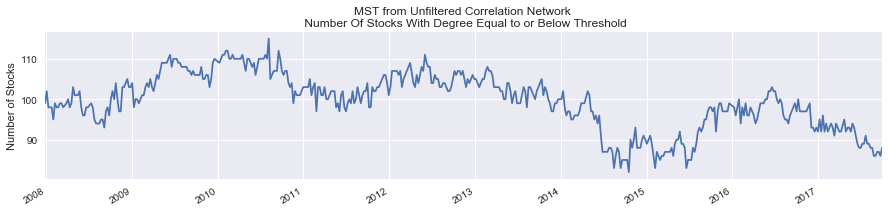

In [198]:
figureSize=(15,3)
plt.figure(figsize=figureSize)
# plot number of stocks with degree equal to or below threshold
nDegreeEqualToOrBelowThreshold=plotNumberOfStocksWithDegreeEqualToOrBelowThreshold(
    degreeByInstrumentByDateMST_U,degreeThreshold,figureSize)
plt.title('MST from Unfiltered Correlation Network \n Number Of Stocks With Degree Equal to or Below Threshold')
plt.ylabel('Number of Stocks')

The trend in this metric (i.e., the number of stocks with a degree of one) is remarkably similar to that of the proportion of variance explained by the first statistical factor discussed above. This very simple indicator is intended help detect periods when co-movement is dominated by a relatively small number stocks.

#### Minimal Spanning Tree from Filtered Correlation Network -  Evolution of Number Of Stocks With Degree Above Threshold  Over Time

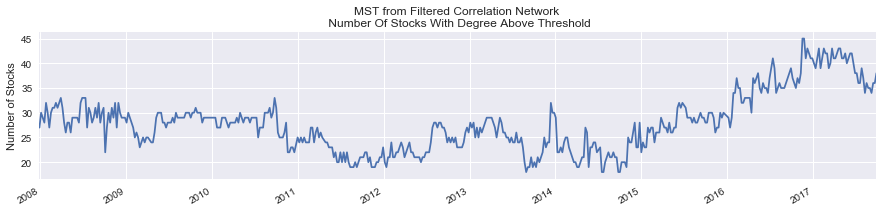

In [199]:
# define figure size
figureSize=(15,3)
plt.figure(figsize=figureSize)
# set degree threshold
degreeThreshold=1
# plot number of stocks with degree above threshold
nDegreeAboveThreshold=plotNumberOfStocksWithDegreeAboveThreshold(
    degreeByInstrumentByDateMST_F,degreeThreshold,figureSize)
plt.title('MST from Filtered Correlation Network \n Number Of Stocks With Degree Above Threshold')
plt.ylabel('Number of Stocks')

Beginning in 2015, we observe a clear uptrend in the number of stocks with a degree greater one. This suggests a more diverse market state.

#### Minimal Spanning Tree from Filtered Correlation Network - Evolution of Number Of Stocks With Degree Equal to or Below Threshold Over Time

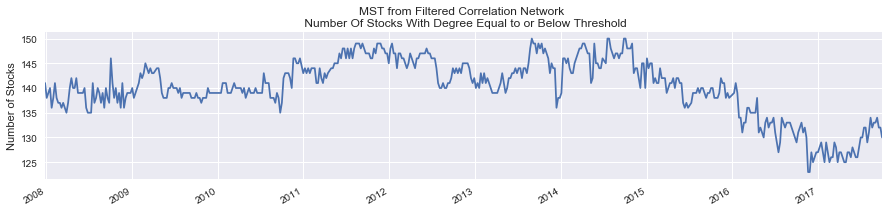

In [200]:
figureSize=(15,3)
plt.figure(figsize=figureSize)
# plot number of stocks with degree equal to or below threshold
nDegreeEqualToOrBelowThreshold=plotNumberOfStocksWithDegreeEqualToOrBelowThreshold(
    degreeByInstrumentByDateMST_F,degreeThreshold,figureSize)
plt.title('MST from Filtered Correlation Network \n Number Of Stocks With Degree Equal to or Below Threshold')
plt.ylabel('Number of Stocks')

After filtering, the Minimal Spanning Trees show a higher tendency towards star-shaped clusters. As a result, the number of stocks with a degree of one is significantly higher for the filtered graph.

The figure directly below shows the degree derived from the unfiltered Minimal Spanning Tree (MST) for each instrument over the period 2008 to 2017-09-29. The result has been computed for each Friday, but is based on the 2-year rolling correlations used in all other sections of the project. Periods with few dark bands and many very light bands represent lower diversification market states. Periods with more medium color bands represent periods where the market structure has a higher number of local clusters and a higher diversification state.

#### Minimal Spanning Tree Degree from Unfiltered Correlation Network - Date By Instrument

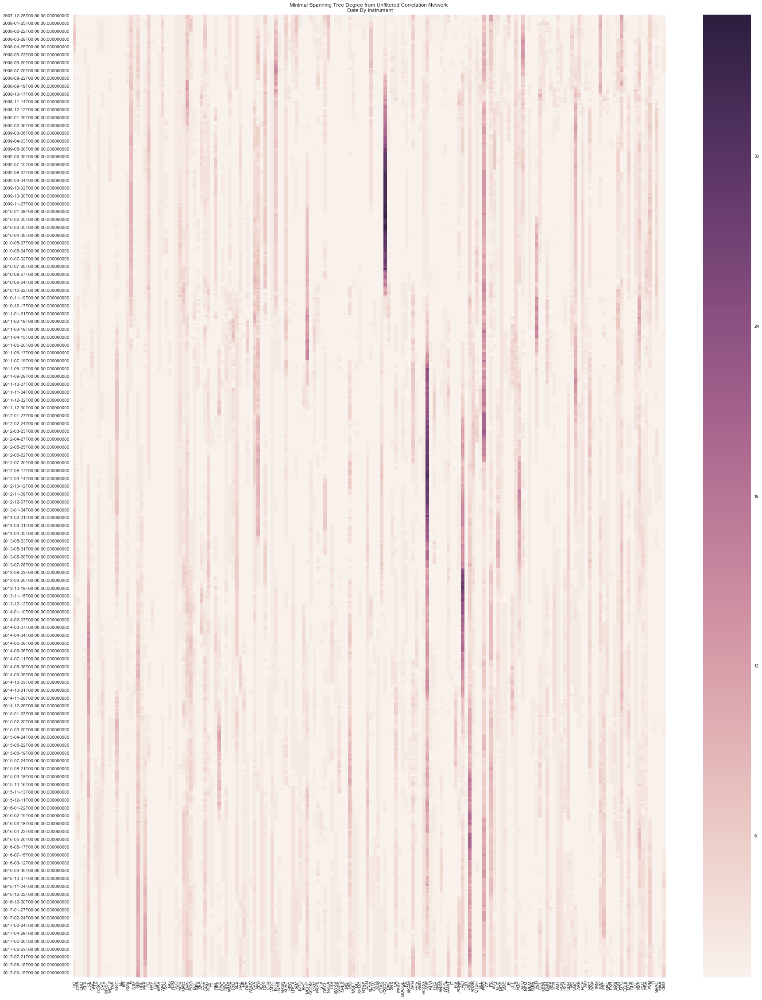

In [202]:
figureSize=(30,40)
plt.figure(figsize=figureSize)
plt.title('Minimal Spanning Tree Degree from Unfiltered Correlation Network \n Date By Instrument')
ax = seaborn.heatmap(degreeByInstrumentByDateMST_U[instrumentTickerSorted.values], 
    annot=False, yticklabels=4,xticklabels=instrumentTickerSorted.values)

#### Minimal Spanning Tree Degree from RMT-Based Filtered Correlation Network - Date By Instrument

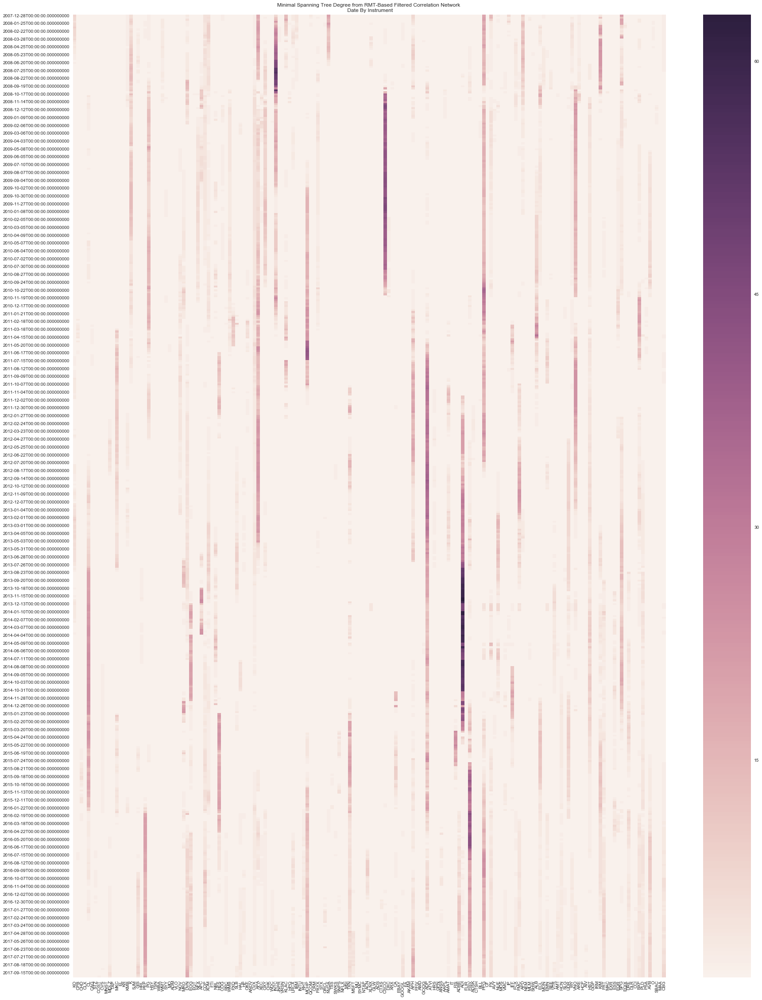

In [203]:
figureSize=(30,40)
plt.figure(figsize=figureSize)
plt.title('Minimal Spanning Tree Degree from RMT-Based Filtered Correlation Network \n Date By Instrument')
ax = seaborn.heatmap(degreeByInstrumentByDateMST_F[instrumentTickerSorted.values], 
    annot=False, yticklabels=4,xticklabels=instrumentTickerSorted.values)

The figure directly above illustrates the weekly degree by ticker - this time for the filtered Minimal Spanning Tree (MST). The vertical bands of darker color represent high degree stocks that are central to the hierarchal market structure that persists. Periods with a small number of dark bands and a high number of very light bands represent lower diversification market states. In such periods, there are a smaller number of clusters typically with a 'star' pattern. Periods with more medium color bands represent periods where the market structure has a higher number of local clusters and a higher diversification state.

The degree-based market state derived from the unfiltered graph shows more diversification, but this result appears to reflect measurement noise and is likely not indicative of the true level of diversity.


## Conclusion

In this project, we developed a few simple metrics intended to serve as proxies for the level of market diversity over time. These indicators did appear to summarize the market state with respect to diversity relatively well. However, the use of only data that is publicly available limits practical usability of the work in this project. In particular, use of publicly available data impairs our ability to address survivorship bias and limits our use of high frequency data that could potentially be used improve the accuracy of our measurements. Using only daily data, it is not possible to construct a more timely indicator of market diversity. A lookback long enough to ensure statistically reliable estimates of the return correlation matrix for a relatively large number of stocks leads to indicators with significant lag.

Although there is a deep literature on the application of Minimal Spanning Trees to financial markets, there are numerous well-known issues to which no solutions are yet available. Initial exploratory work has shown that after the application of RMT-based filtering of the correlation matrices used in the construction of the Minimal Spanning Trees, the most important single stocks - i.e., those at the center of clusters - appear to be relatively persistant over time. Other researchers have found that small perturbations of the input data can cause big differences in the resulting clusters. RMT-based filtering clearly improves the stability of results, but a bootstrapping-based approach might lead to a more robust, intuitive, and interpretable result.

In the future, we plan to extend this work to use high frequency data for the same instrument universe. This data set also includes all stocks that were constituents of the S&P500 instrument universe over the period rather than just the current constituents of the index.


## References

[1] R. Allez, J.-P. Bouchaud, J. Bun, M. Potters, Rotational invariant estimator for general noisy matrices, arXiv: 1502.06736 [cond-mat.stat-mech] (2015).

[2] L. A. N. Amaral, , P. Gopikrishnan, T. Guhr, V. Plerou, B. Rosenow, H. E. Stanley, A Random Matrix Approacch to Cross-Correlations in Financial Data, arXiv:cond-mat/0108023v1 [cond-mat.stat-mech] (2001).

[3] M. Binkowski, R. Donnat, G. Marti, F. Nielsen, A Review of two decades of correlations, hierarchies, networks and clustering in financial markets, arXiv:1703.00485v2 [q-fin.ST] (2017).

[4] J.-P. Bouchaud, J. Bun,  M. Potters, Cleaning large correlation matrices: tools from Random Matrix Theory, arXiv: 1610.08104 [cond-mat.stat-mech] (2016).

[5] J.-P. Bouchaud, C. Deremble, Y. Lemperiere, T.-L. Dao, T.-T. Nguyen, M. Potters, Tail protection for long investors: trend convexity at work, arXiv:1607.02410v1 [q-fin.GN] (2016)

[6] J.-P. Bouchaud, L. Laloux, M. Potters,Financial Applications of Random Matrix Theory: Old Laces and New Pieces, arXiv:physics/0507111v1 [physics.data-an] (2005)

[7] G. Bonanno, F. Lillo, R. N. Mantegna, High-frequency cross-correlation in a set of stocks, arXiv:cond-mat/0009350v2 [cond-mat.stat-mech] (2000).

[8] J.-P. Bouchaud, M. Potters, Financial Applications of Random Matrix Theory: A Short Review, arXiv:0910.1205v1 [q-fin.ST] (2009).

[9] G. Caldarelli, A. Chessa, Data Science & Complex Networks, Oxford University Press, 2016.

[10] C Coronnello, F. Lillo, R. N. Mantegna, S. Micciche, M. Tumminello, Sector identification in a set of stock return time series traded at the London Stock Exchange, arXiv:cond-mat/0508122v1 (2005)

[11] C. Coronnello, F. Lillo, R. N. Mantegna, S. Micciche, M. Tumminello, Spanning trees and bootstrap reliability estimation in correlation based networks, arXiv:physics/0605116v1 (2006)

[12] M. Djauhari, S. Gan, Optimality problem of network topology in stocks market analysis, Physica A: Statistical Mechanics and Its Applications, 419 (2015), 108-114.

[13] S. Drozdz, M. Forczek, J. Kwapien, Pawel Oswiecimka, Minimum spanning tree filtering of correlations for varying time scales and size of fluctuations, arXiv:1610.08416v2 [q-fin.ST] (2017).

[14] D. J. Fenn, N. F. Johnson, N. S. Jones, M. McDonald, M. A. Porter, S. Williams, Temporal evolution of financial-market correlations, Physical Review E 84 (2011), 026109.

[15] A. Golub and Z. Guo, Correlation Stress Tests Under the Random Matrix Theory: An Empirical Implementation to the Chinese Market (2012).

[16] N.J. Higham, Computing a nearest symmetric positive semidefinite matrix,Linear Algebra and its Applications
Volume 103 (1988), 103-118.

[17] A. Kouznetsov, M. Tsvetovat, Social Network Analysis for Startups. O’Reilly Media, 2011.

[18] O. Ledoit, S. Peche, Eigenvectors of some large sample covariance matrix ensembles, Probability Theory and Related Fields, Vol. 151 (1) (2011), 233-264.

[19] O. Ledoit, M. Wolf, Improved estimation of the covariance matrix of stock returns with an application to portfolio selection,  Journal of Empirical Finance, Vol. 10 (5)(2003), 603-621.

[20] O. Ledoit, M. Wolf, A well-conditioned estimator for large-dimensional covariance matrices, Journal of Multivariate Analysis, Vol. 88 (2) (2004), 365-411.

[21] O. Ledoit, M. Wolf, Nonlinear shrinkage estimation of large-dimensional covariance matrices, The Annals of Statistics, Vol. 40 (2) (2012), pp 1024-1060.

[22] F. Lillo, R. N. Mantegna, M. Tumminello, Hierarchically nested factor model from multivariate data, arXiv:cond-mat/0511726v2 [cond-mat.dis-nn] (2007).

[23] R. N. Mantegna, Hierarchical structure in financial markets, The European Physical Journal B-Condensed Matter and Complex Systems, 11(1) (1999), 193-197.

[24] R. N. Mantegna, H. E. Stanley, Introduction to econophysics: correlations and complexity in finance, Cambridge University Press, 1999.

[25] V. A. Marcenko and L. A. Pastur, Distribution of Eigenvalues for Some Sets of Random Matrices, Mathematics of the USSR-Sbornik, Vol. 1 (4) (1967), 457-483.

[26] A Meucci, Risk and Asset Allocation, $1^{st}$ Ed, Springer Berlin Heidelberg, 2009.

[27] D. Skillicorn, Understanding Complex Datasets: Data Mining with Matrix Decompositions, Chapman and Hall/CRC, 2007.


## Appendix A:  Instrument Universe

The following instruments were included in the data set used for the analytical sections of this project:


In [204]:
# create table of instrument master for subset
subsetInstrumentMaster.style


,instrumentTicker,instrumentName,gicsSectorName,gicsSubIndustryName
3,ACN,Accenture plc,Information Technology,IT Consulting & Other Services
4,ATVI,Activision Blizzard,Information Technology,Home Entertainment Software
6,ADBE,Adobe Systems Inc,Information Technology,Application Software
7,AMD,Advanced Micro Devices Inc,Information Technology,Semiconductors
14,APD,Air Products & Chemicals Inc,Materials,Industrial Gases
15,AKAM,Akamai Technologies Inc,Information Technology,Internet Software & Services
17,ALB,Albemarle Corp,Materials,Specialty Chemicals
18,ARE,Alexandria Real Estate Equities Inc,Real Estate,Office REITs
23,ADS,Alliance Data Systems,Information Technology,Data Processing & Outsourced Services
26,GOOGL,Alphabet Inc Class A,Information Technology,Internet Software & Services
